In [8]:
from google.colab import drive
import os
import glob

# Google Drive'ı mount et
drive.mount('/content/drive')

# Çalışma dizinini değiştir
os.chdir('/content/drive/MyDrive/Colab Notebooks/Open')

# Yol tanımları (göreli yollar olacak şekilde)
data_dir = "Datas"
test_dir = "Test"

# Klasörlerin varlığını kontrol et
print("Data klasörü var mı?", os.path.exists(data_dir))
print("Test klasörü var mı?", os.path.exists(test_dir))

# CSV dosyalarının listesini göster
data_files = glob.glob(os.path.join(data_dir, "*.csv"))
print("Data CSV dosyaları:", data_files)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Data klasörü var mı? True
Test klasörü var mı? True
Data CSV dosyaları: ['Datas/ARCLK.csv', 'Datas/ASELS.csv', 'Datas/BIMAS.csv', 'Datas/EKGYO.csv', 'Datas/EREGL.csv', 'Datas/FROTO.csv', 'Datas/GARAN.csv', 'Datas/GUBRF.csv', 'Datas/HEKTS.csv', 'Datas/KCHOL.csv', 'Datas/KOZAA.csv', 'Datas/KOZAL.csv', 'Datas/KRDMD.csv', 'Datas/MGROS.csv', 'Datas/PGSUS.csv', 'Datas/PETKM.csv', 'Datas/SAHOL.csv', 'Datas/SASA.csv', 'Datas/SOKM.csv', 'Datas/SISE.csv', 'Datas/TCELL.csv', 'Datas/THYAO.csv', 'Datas/TKFEN.csv', 'Datas/TOASO.csv', 'Datas/TUPRS.csv', 'Datas/VAKBN.csv', 'Datas/YKBNK.csv', 'Datas/BRSAN.csv', 'Datas/ALARK.csv', 'Datas/AKBNK.csv']


In [9]:
import pandas as pd
import numpy as np
import random
import logging
import traceback
import os
import warnings
from glob import glob
from sklearn.preprocessing import RobustScaler, MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    confusion_matrix,
    accuracy_score,
    recall_score,
    precision_score,
    log_loss,
    f1_score
)
import ta
import tensorflow as tf
from tensorflow import keras
from keras.api.models import Model
from keras.api.layers import Input, LSTM, BatchNormalization, Dropout, Dense
from keras.api.optimizers import RMSprop
from keras.api.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard, ReduceLROnPlateau
from keras.api.metrics import MeanAbsoluteError, MeanSquaredError, MeanSquaredLogarithmicError, BinaryAccuracy, Precision, Recall
from keras.api.callbacks import Callback
import tensorflow.python.keras.backend as K
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Tuple, List, Dict
from sklearn.calibration import CalibratedClassifierCV
from sklearn.isotonic import IsotonicRegression
from scipy.optimize import minimize_scalar
import joblib
import copy

In [4]:
class LrLogger(Callback):
    def on_train_begin(self, logs=None):
        self.lrs = []
    def on_epoch_end(self, epoch, logs=None):
        lr = float(K.get_value(self.model.optimizer.learning_rate))
        self.lrs.append(lr)

In [5]:
# ----------------------------
# 1) Reproducibility / Logging
# ----------------------------
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s [%(levelname)s] %(message)s",
    handlers=[logging.StreamHandler()],
    force=True
)
logger = logging.getLogger(__name__)

In [20]:
# ----------------------------
# 2) Enhanced Configuration
# ----------------------------
CONFIG = {
    "window_size": 64,
    "test_size": 64,
    "features": ["OpenChange", "RSI", "Volatility", "MA_20", "ODirection"],

    "lstm_units": [128, 64],
    "dense_units": [32, 16],
    "dropout_rate": 0.4,

    "epochs": 128,
    "batch_size": 96,
    "patience": 16,
    "learning_rate": 0.001,
    "tscv_splits": 7,

    "data_paths": ["Datas/*.csv", "Test/*.csv"],
    "start_date": "2015-07-27",
    "end_date": "2025-05-06",
    "company_index": 25,

    "plot_history": True,
    "plot_predictions": True,
    "plot_metrics": True
}

In [11]:
def load_and_preprocess_all(paths: List[str]) -> Tuple[pd.DataFrame, pd.DataFrame]:

    files = []
    company_index = CONFIG.get("company_index", None)

    datas_dir = "Datas"
    if not os.path.exists(datas_dir):
        logger.error(f"Directory '{datas_dir}' not found. Please ensure your data is in the correct path.")
        raise FileNotFoundError(f"Directory '{datas_dir}' not found.")

    for pattern in paths:
        matched_files = sorted(glob(pattern))
        if company_index is not None:
            if len(matched_files) > company_index:
                files.append(matched_files[company_index])
            else:
                logger.warning(f"Index {company_index} exceeds file count in path: {pattern}. Skipping this pattern.")
        else:
            files.extend(matched_files)

    if not files:
        raise FileNotFoundError("No CSV files found matching the patterns. Please check 'data_paths' and 'company_index'.")

    dfs = []
    for fn in files:
        try:
            df = pd.read_csv(
                fn, skiprows=2, header=None,
                names=["Date", "Close", "High", "Low", "Open", "Volume"]
            )
            df["Date"] = pd.to_datetime(df["Date"], errors='coerce', format='mixed')
            df = df.dropna(subset=["Date"])

            mask = (
                (df["Date"] >= pd.to_datetime(CONFIG["start_date"])) &
                (df["Date"] <= pd.to_datetime(CONFIG["end_date"]))
            )
            df = df.loc[mask]

            if df.empty:
                logger.warning(f"DataFrame for {fn} is empty after date filtering. Skipping.")
                continue

            for col in ["Close", "High", "Low", "Open", "Volume"]:
                df[col] = pd.to_numeric(df[col], errors='coerce')

            df = df.dropna()

            if df.empty:
                logger.warning(f"DataFrame for {fn} is empty after NaN dropping. Skipping.")
                continue

            dfs.append(df)
        except Exception as e:
            logger.error(f"Error processing {fn}: {e}")

    if not dfs:
        logger.error("All dataframes are empty or failed to load. Returning empty DataFrames.")
        return pd.DataFrame(), pd.DataFrame()

    df = pd.concat(dfs, ignore_index=True)
    df = df.sort_values(by="Date")
    df = df.drop_duplicates(subset='Date', keep='last')

    date_range = pd.date_range(start=df['Date'].min(), end=df['Date'].max(), freq='B')
    df = df.set_index('Date').reindex(date_range).rename_axis('Date').reset_index()

    df["OpenChange"] = df["Open"].pct_change(fill_method=None) * 100
    df["OpenChange"] = df["OpenChange"].astype(float)
    df = df.dropna().reset_index(drop=True)

    df["ODirection"] = np.where(df["OpenChange"] < 0, 0, 1)

    if len(df) >= 20:
        df["MA_20"] = df["Close"].rolling(20).mean()
    else:
        logger.warning(f"DataFrame length ({len(df)}) is less than 20 for MA_20 calculation.")
        df["MA_20"] = df["Close"]

    if len(df) >= 14:
        df["RSI"] = ta.momentum.RSIIndicator(df["Close"], window=14).rsi()
    else:
        logger.warning(f"DataFrame length ({len(df)}) is less than 14 for RSI calculation.")
        df["RSI"] = 50.0

    if len(df) >= 5:
        df["Volatility"] = df["Close"].pct_change().rolling(5).std()
    else:
        logger.warning(f"DataFrame length ({len(df)}) is less than 5 for Volatility calculation.")
        df["Volatility"] = 0.01

    df = df.dropna().reset_index(drop=True)

    if df.empty:
        logger.error("DataFrame is empty after feature engineering and dropping NaNs. Cannot proceed.")
        return pd.DataFrame(), pd.DataFrame()

    window_size = CONFIG["window_size"]
    test_size = CONFIG["test_size"]

    if len(df) < window_size + test_size:
        logger.warning(f"DataFrame length ({len(df)}) is very small for window_size ({window_size}). "
                       f"Consider increasing data duration. Current length: {len(df)}")
        test_size = max(int(len(df) * 0.2), 1)

    if len(df) >= window_size + test_size:
        df_test = df.iloc[-(test_size):].copy()
        df_train = df.iloc[:-(test_size)]
    else:
        logger.warning(f"DataFrame length ({len(df)}) is smaller than window_size+test_size. Using fallback split.")
        split_idx = max(len(df) - test_size, window_size)
        df_train = df.iloc[:split_idx].copy()
        df_test = df.iloc[split_idx:].copy()

    if df_train.empty:
        logger.error("Training DataFrame is empty after splitting. Adjust 'start_date' or data length.")
        return pd.DataFrame(), pd.DataFrame()

    df_test
    df_train

    return df_train, df_test

In [12]:
def create_sequences(data: np.ndarray, window_size: int) -> Tuple[np.ndarray, np.ndarray]:
    X, y = [], []
    for i in range(len(data) - window_size):
        X.append(data[i:i+window_size])
        y.append(data[i+window_size])
    return np.array(X), np.array(y)

In [13]:
def create_enhanced_model(input_shape: Tuple[int, int]) -> Model:

    inp = Input(shape=input_shape)

    # -------- SHARED FEATURE EXTRACTION -------- #
    shared = LSTM(CONFIG["lstm_units"][0], return_sequences=True,
                  kernel_initializer='glorot_uniform',
                  recurrent_initializer='orthogonal',
                  bias_initializer='zeros')(inp)
    shared = BatchNormalization()(shared)
    shared = Dropout(CONFIG["dropout_rate"])(shared)

    # -------- PRICE PATH -------- #
    x_price = LSTM(CONFIG["lstm_units"][1], return_sequences=False)(shared)
    x_price = BatchNormalization()(x_price)
    x_price = Dropout(CONFIG["dropout_rate"])(x_price)

    x_price = Dense(CONFIG["dense_units"][0], activation="swish")(x_price)
    x_price = BatchNormalization()(x_price)
    x_price = Dense(CONFIG["dense_units"][1], activation="swish")(x_price)

    price_out = Dense(1, activation="linear", name="price_output")(x_price)

    # -------- DIRECTION PATH -------- #
    x_dir = LSTM(32, return_sequences=False)(inp)
    x_dir = BatchNormalization()(x_dir)
    x_dir = Dropout(CONFIG["dropout_rate"])(x_dir)
    x_dir = Dense(16, activation="swish")(x_dir)
    x_dir = BatchNormalization()(x_dir)
    x_dir = Dense(8, activation="swish")(x_dir)

    direction_out = Dense(1, activation="sigmoid", name="direction_output")(x_dir)

    # Final model
    model = Model(inputs=inp, outputs=[price_out, direction_out])

    return model

In [14]:
def calibrate_probabilities(y_true, y_prob, method='isotonic'):
    """
    Olasılık kalibrasyonu için yardımcı fonksiyon.
    Bu, modelin güven skorlarını daha güvenilir hale getirir.
    """
    if method == 'isotonic':
        calibrator = IsotonicRegression(out_of_bounds='clip')
        calibrator.fit(y_prob, y_true)
        return calibrator
    elif method == 'platt':
        # Basit Platt scaling implementasyonu
        from sklearn.linear_model import LogisticRegression
        calibrator = LogisticRegression()
        calibrator.fit(y_prob.reshape(-1, 1), y_true)
        return calibrator
    return None

def find_optimal_threshold(y_true, y_prob, metric='f1'):
    """
    En iyi sınıflandırma eşiği için optimize edici fonksiyon.
    Bu, varsayılan 0.5 eşiğinden daha iyi performans sağlayabilir.
    """
    def objective(threshold):
        y_pred = (y_prob >= threshold).astype(int)
        if metric == 'f1':
            return -f1_score(y_true, y_pred, zero_division=0)
        elif metric == 'accuracy':
            return -accuracy_score(y_true, y_pred)
        elif metric == 'precision':
            return -precision_score(y_true, y_pred, zero_division=0)
        elif metric == 'recall':
            return -recall_score(y_true, y_pred, zero_division=0)
        else:
            # Balanced accuracy (precision + recall) / 2
            prec = precision_score(y_true, y_pred, zero_division=0)
            rec = recall_score(y_true, y_pred, zero_division=0)
            return -(prec + rec) / 2

    # 0.1 ile 0.9 arasında en iyi eşiği bul
    result = minimize_scalar(objective, bounds=(0.1, 0.9), method='bounded')
    return result.x

def calculate_confidence_metrics(y_true, y_prob, y_pred):
    """
    Model güvenilirliği için ek metrikler hesaplar.
    Bu metrikler modelin ne kadar güvenilir olduğunu anlamamızı sağlar.
    """
    # Brier Score - olasılık tahminlerinin kalitesini ölçer
    brier_score = np.mean((y_prob - y_true) ** 2)

    # Expected Calibration Error (ECE)
    # Bu, modelin güven skorlarının ne kadar kalibre olduğunu ölçer
    n_bins = 10
    bin_boundaries = np.linspace(0, 1, n_bins + 1)
    bin_lowers = bin_boundaries[:-1]
    bin_uppers = bin_boundaries[1:]

    ece = 0
    for bin_lower, bin_upper in zip(bin_lowers, bin_uppers):
        in_bin = (y_prob > bin_lower) & (y_prob <= bin_upper)
        prop_in_bin = in_bin.mean()

        if prop_in_bin > 0:
            accuracy_in_bin = y_true[in_bin].mean()
            avg_confidence_in_bin = y_prob[in_bin].mean()
            ece += np.abs(avg_confidence_in_bin - accuracy_in_bin) * prop_in_bin

    return {
        'brier_score': brier_score,
        'expected_calibration_error': ece,
        'mean_confidence': np.mean(y_prob),
        'confidence_std': np.std(y_prob)
    }

In [15]:
def train_model_enhanced(X_train: np.ndarray, y_price: np.ndarray, y_dir: np.ndarray, company_code, CONFIG: dict):
    """
    Geliştirilmiş model eğitimi - eşik optimizasyonu ve güven kalibrasyonu ile
    """

    tscv = TimeSeriesSplit(n_splits=CONFIG["tscv_splits"])
    fold_results = []

    # Her fold için kalibrasyon verilerini saklamak için
    calibration_data = []

    if y_dir.ndim > 1:
        y_dir_flat_for_weights = y_dir.flatten()
    else:
        y_dir_flat_for_weights = y_dir

    for fold, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
        logger.info(f"Training Enhanced Fold {fold+1}/{CONFIG['tscv_splits']}")

        y_dir_fold_train = y_dir[train_idx].flatten()
        y_dir_fold_val = y_dir[val_idx].flatten()

        # Sınıf ağırlıkları hesaplama
        train_counts = np.bincount(y_dir_fold_train, minlength=2)
        train_total = train_counts.sum()

        class_weights = {}
        for i in range(2):
            class_weights[i] = train_total / (2 * train_counts[i])

        sample_weights = np.array([class_weights[cls] for cls in y_dir_fold_train])

        # Model oluşturma ve derleme (orijinal kodunuzdan)
        model = create_enhanced_model((CONFIG["window_size"], len(CONFIG["features"])))

        optimizer = RMSprop(
            learning_rate=CONFIG["learning_rate"],
            clipnorm=0.5
        )

        model.compile(
            optimizer=optimizer,
            loss={
                "price_output": "huber",
                "direction_output": "binary_crossentropy"
            },
            loss_weights={"price_output": 0.75, "direction_output": 0.25},
            metrics={
                "price_output": [
                    MeanAbsoluteError(name="mae_price"),
                    MeanSquaredError(name='mean_squared_error'),
                    MeanSquaredLogarithmicError(name='mean_squared_logarithmic_error'),
                ],
                "direction_output": [
                    BinaryAccuracy(name="binary_accuracy"),
                    Precision(name="precision"),
                    Recall(name="recall"),
                ]
            }
        )

        lr_logger = LrLogger()

        callbacks = [
            EarlyStopping(monitor="val_loss", patience=CONFIG["patience"], restore_best_weights=True, verbose=1),
            ModelCheckpoint(f"temp_model_fold{fold+1}.keras", monitor="val_loss", save_best_only=True, verbose=1),
            TensorBoard(log_dir=os.path.join("logs", f"fold{fold+1}")),
            ReduceLROnPlateau(monitor="val_loss", factor=0.7, patience=8, verbose=1, cooldown=5, min_lr=1e-8),
            lr_logger
        ]

        # Model eğitimi
        history_obj = model.fit(
            X_train[train_idx],
              [
                  y_price[train_idx],                    # First output: price
                  y_dir[train_idx].reshape(-1,1)         # Second output: direction
              ],
              validation_data=(
                  X_train[val_idx],
                  [
                      y_price[val_idx],                  # First output: price
                      y_dir[val_idx].reshape(-1,1)       # Second output: direction
                  ]
              ),
              sample_weight=[
                  np.ones(len(train_idx)),               # Weights for first output (price)
                  sample_weights                         # Weights for second output (direction)
              ],
            epochs=CONFIG["epochs"],
            batch_size=CONFIG["batch_size"],
            callbacks=callbacks,
            verbose=1
        )

        history_obj.history['lr'] = lr_logger.lrs

        # Validation tahminleri al - kalibrasyon için
        val_predictions = model.predict(X_train[val_idx], verbose=0)
        val_price_pred = val_predictions[0]
        val_dir_prob = val_predictions[1].flatten()

        # En iyi eşiği bul
        optimal_threshold = find_optimal_threshold(y_dir_fold_val, val_dir_prob, metric='f1')
        logger.info(f"Fold {fold+1} optimal threshold: {optimal_threshold:.3f}")

        # Kalibrasyon verilerini kaydet
        calibration_data.append({
            'y_true': y_dir_fold_val,
            'y_prob': val_dir_prob,
            'fold': fold
        })

        # Optimal eşikle performans hesapla
        val_dir_pred_optimal = (val_dir_prob >= optimal_threshold).astype(int)
        optimal_accuracy = accuracy_score(y_dir_fold_val, val_dir_pred_optimal)
        optimal_f1 = f1_score(y_dir_fold_val, val_dir_pred_optimal, zero_division=0)

        # Güven metrikleri hesapla
        confidence_metrics = calculate_confidence_metrics(
            y_dir_fold_val, val_dir_prob, val_dir_pred_optimal
        )

        # Orijinal performans metrikleri
        val_loss_key = "val_loss"
        if val_loss_key in history_obj.history:
            best_val_loss = min(history_obj.history[val_loss_key])
            best_epoch = np.argmin(history_obj.history[val_loss_key])
        else:
            val_price_key = "val_price_output_loss"
            val_dir_key = "val_direction_output_loss"

            if val_price_key in history_obj.history and val_dir_key in history_obj.history:
                combined_val_loss = [p + d for p, d in zip(history_obj.history[val_price_key],
                                                          history_obj.history[val_dir_key])]
                best_val_loss = min(combined_val_loss)
                best_epoch = np.argmin(combined_val_loss)
            else:
                best_val_loss = float('inf')
                best_epoch = len(history_obj.history[list(history_obj.history.keys())[0]]) - 1

        try:
            best_price_mae = history_obj.history.get('val_price_output_mae_price', [float('inf')])[best_epoch]
            best_dir_accuracy = history_obj.history.get('val_direction_output_binary_accuracy', [0.0])[best_epoch]
        except (IndexError, KeyError):
            best_price_mae = min(history_obj.history.get('val_price_output_mae_price', [float('inf')]))
            best_dir_accuracy = max(history_obj.history.get('val_direction_output_binary_accuracy', [0.0]))

        fold_results.append({
            'fold': fold + 1,
            'model': model,
            'history': history_obj.history,
            'val_loss': best_val_loss,
            'price_mae': best_price_mae,
            'direction_accuracy': best_dir_accuracy,
            'best_epoch': best_epoch,
            'model_path': f"temp_model_fold{fold+1}.keras",
            # Yeni eklenen metrikler
            'optimal_threshold': optimal_threshold,
            'optimal_accuracy': optimal_accuracy,
            'optimal_f1': optimal_f1,
            'brier_score': confidence_metrics['brier_score'],
            'calibration_error': confidence_metrics['expected_calibration_error'],
            'mean_confidence': confidence_metrics['mean_confidence'],
            'confidence_std': confidence_metrics['confidence_std']
        })

        logger.info(f"Fold {fold+1} Enhanced Metrics:")
        logger.info(f"Best validation loss: {best_val_loss:.4f} at epoch {best_epoch}")
        logger.info(f"Standard accuracy (0.5 threshold): {best_dir_accuracy:.4f}")
        logger.info(f"Optimized accuracy ({optimal_threshold:.3f} threshold): {optimal_accuracy:.4f}")
        logger.info(f"Optimized F1 score: {optimal_f1:.4f}")
        logger.info(f"Brier score: {confidence_metrics['brier_score']:.4f}")
        logger.info(f"Calibration error: {confidence_metrics['expected_calibration_error']:.4f}")

        if CONFIG.get("plot_history", False):
            plot_training_history(history_obj.history, fold+1, company_code)

    if not fold_results:
        logger.error("No models were trained successfully. Check data and class distribution.")
        return None, None, None, None

    # Global kalibrator oluştur (tüm foldların verisiyle)
    all_y_true = np.concatenate([data['y_true'] for data in calibration_data])
    all_y_prob = np.concatenate([data['y_prob'] for data in calibration_data])

    global_calibrator = calibrate_probabilities(all_y_true, all_y_prob, method='isotonic')
    global_optimal_threshold = find_optimal_threshold(all_y_true, all_y_prob, metric='f1')

    logger.info("ENHANCED MODEL EVALUATION WITH THRESHOLD OPTIMIZATION & CALIBRATION")

    logger.info(f"Global optimal threshold: {global_optimal_threshold:.3f}")

    for result in fold_results:
        logger.info(f"Fold {result['fold']} Enhanced Results:")
        logger.info(f"Validation Loss: {result['val_loss']:.4f}")
        logger.info(f"Price MAE: {result['price_mae']:.4f}")
        logger.info(f"Standard Accuracy (0.5): {result['direction_accuracy']:.4f}")
        logger.info(f"Optimized Accuracy ({result['optimal_threshold']:.3f}): {result['optimal_accuracy']:.4f}")
        logger.info(f"Optimized F1: {result['optimal_f1']:.4f}")
        logger.info(f"Brier Score: {result['brier_score']:.4f}")
        logger.info(f"Calibration Error: {result['calibration_error']:.4f}")

    def select_best_model_enhanced(fold_results):
        """
        Geliştirilmiş model seçimi - hem geleneksel hem de yeni metrikleri dikkate alır
        """
        # Önce validation loss'a göre sırala
        sorted_by_val_loss = sorted(fold_results, key=lambda x: x['val_loss'])
        top_candidates = sorted_by_val_loss[:min(3, len(sorted_by_val_loss))]

        logger.info("Top candidates by validation loss:")
        for i, candidate in enumerate(top_candidates):
            logger.info(f"{i+1}. Fold {candidate['fold']} - Val Loss: {candidate['val_loss']:.4f}, "
                       f"Opt F1: {candidate['optimal_f1']:.4f}, Cal Error: {candidate['calibration_error']:.4f}")

        # Eğer validation loss'lar çok yakınsa, diğer metrikleri de kullan
        val_loss_threshold = 0.02
        min_val_loss = top_candidates[0]['val_loss']

        close_candidates = [c for c in top_candidates
                           if abs(c['val_loss'] - min_val_loss) / min_val_loss <= val_loss_threshold]

        if len(close_candidates) > 1:
            logger.info(f"Validation losses within {val_loss_threshold*100}% threshold.")
            logger.info("Selecting based on combined score (F1 + calibration quality):")

            # Kombine skor: Yüksek F1, düşük kalibrasyon hatası
            for candidate in close_candidates:
                # F1 skorunu normalize et (0-1 arası)
                # Kalibrasyon hatasını ters çevir (düşük hata = yüksek skor)
                calibration_score = max(0, 1 - candidate['calibration_error'])
                combined_score = (candidate['optimal_f1'] + calibration_score) / 2
                candidate['combined_score'] = combined_score
                logger.info(f"  Fold {candidate['fold']}: F1={candidate['optimal_f1']:.4f}, "
                           f"Cal_Score={calibration_score:.4f}, Combined={combined_score:.4f}")

            best_candidate = max(close_candidates, key=lambda x: x['combined_score'])
            selection_reason = "Best combined F1 and calibration score"
        else:
            best_candidate = top_candidates[0]
            selection_reason = "Lowest validation loss"

        return best_candidate, selection_reason

    # En iyi modeli seç
    logger.info("ENHANCED SELECTION METHOD:")
    best_fold_result, reason = select_best_model_enhanced(fold_results)
    best_fold_idx = best_fold_result['fold']

    logger.info(f"FINAL ENHANCED MODEL SELECTION: Fold {best_fold_idx}")
    logger.info(f"Selection reason: {reason}")
    logger.info(f"Validation loss: {best_fold_result['val_loss']:.4f}")
    logger.info(f"Price MAE: {best_fold_result['price_mae']:.4f}")
    logger.info(f"Standard accuracy: {best_fold_result['direction_accuracy']:.4f}")
    logger.info(f"Optimized accuracy: {best_fold_result['optimal_accuracy']:.4f}")
    logger.info(f"Optimized F1: {best_fold_result['optimal_f1']:.4f}")
    logger.info(f"Optimal threshold: {best_fold_result['optimal_threshold']:.3f}")
    logger.info(f"Brier score: {best_fold_result['brier_score']:.4f}")
    logger.info(f"Calibration error: {best_fold_result['calibration_error']:.4f}")

    # En iyi modeli kaydet
    best_model = best_fold_result['model']
    #best_model.save("models/best_enhanced_model.keras")

    # Kalibrasyon parametrelerini kaydet
    calibration_params = {
        'global_optimal_threshold': global_optimal_threshold,
        'fold_optimal_threshold': best_fold_result['optimal_threshold'],
        'global_calibrator': global_calibrator,
        'best_fold': best_fold_idx
    }

    # Geçici dosyaları temizle
    for result in fold_results:
        temp_path = result['model_path']
        if os.path.exists(temp_path):
            os.remove(temp_path)
            logger.info(f"Cleaned up temporary model: {temp_path}")

    # Fold sonuçlarını da geri döndür (analiz için)
    return best_model, best_fold_result['history'], best_fold_idx, calibration_params, fold_results

In [16]:
def walk_forward_preds_enhanced(best_model: tf.keras.Model,
                               calibration_params: dict,
                               df_test: pd.DataFrame,
                               scaler_y: RobustScaler,
                               X_train_scaled: np.ndarray,
                               scaler_X: RobustScaler,
                               n_steps: int,
                               CONFIG: dict):
    """
    Geliştirilmiş walk-forward tahmin - eşik optimizasyonu ve kalibrasyon ile
    """

    warnings.filterwarnings('ignore',
                            message='X does not have valid feature names, but RobustScaler was fitted with feature names',
                            category=UserWarning)

    # Kalibrasyon parametrelerini al
    optimal_threshold = calibration_params.get('fold_optimal_threshold', 0.5)
    calibrator = calibration_params.get('global_calibrator', None)

    # Özellik indekslerini al
    open_change_idx = CONFIG["features"].index("OpenChange")
    direction_idx = CONFIG["features"].index("ODirection")
    window_size = CONFIG["window_size"]
    features = CONFIG["features"]

    # Başlangıç penceresi
    temp_scaled = np.copy(X_train_scaled)
    current_window = temp_scaled[-window_size:]

    # Sonuç listelerini başlat
    result = []
    predicted_opens = []
    predicted_dirs = []
    predicted_dirs_calibrated = []
    dir_probabilities = []
    dir_probabilities_calibrated = []
    true_opens = []
    true_dirs = []

    logger.info(f"Enhanced walk-forward prediction starting with threshold: {optimal_threshold:.3f}")

    # Test verisinden sadece n_steps kadar al
    df_slice = df_test.reset_index(drop=True).iloc[:n_steps]

    for step in range(len(df_slice)):
        # Mevcut pencere ile tahmin yap
        price_scaled, dir_prob = best_model.predict(
            current_window.reshape(1, window_size, len(features)),
            verbose=0
        )

        # Fiyat tahminini ters ölçekle
        price_unscaled = scaler_y.inverse_transform(price_scaled)[0][0]

        # Ham olasılık
        raw_prob = dir_prob[0, 0]

        # Kalibre edilmiş olasılık
        if calibrator is not None:
            try:
                if hasattr(calibrator, 'predict_proba'):
                    # Platt scaling için
                    calibrated_prob = calibrator.predict_proba([[raw_prob]])[0, 1]
                else:
                    # Isotonic regression için
                    calibrated_prob = calibrator.transform([raw_prob])[0]
                calibrated_prob = np.clip(calibrated_prob, 0.001, 0.999)  # Numerik stabilite
            except:
                calibrated_prob = raw_prob
        else:
            calibrated_prob = raw_prob

        # Gerçek değerleri al
        y_true_price = float(df_slice["OpenChange"].iloc[step])
        y_true_dir = int(df_slice["ODirection"].iloc[step])

        # Tahmin edilen yön (optimal eşikle)
        y_pred_dir_raw = int(raw_prob >= 0.5)  # Standart eşik
        y_pred_dir_optimal = int(raw_prob >= optimal_threshold)  # Optimal eşik
        y_pred_dir_calibrated = int(calibrated_prob >= optimal_threshold)  # Kalibre + optimal

        # Gerçek değerleri scaled forma çevir
        true_values = df_slice.iloc[step][features].values.reshape(1, -1)
        true_scaled = scaler_X.transform(true_values)[0]

        # Kaydırmalı pencereyi güncelle
        current_window = np.vstack([current_window[1:], true_scaled])

        # Tahmin ve gerçek değerleri kaydet
        predicted_opens.append(price_unscaled)
        predicted_dirs.append(y_pred_dir_optimal)
        predicted_dirs_calibrated.append(y_pred_dir_calibrated)
        dir_probabilities.append(raw_prob)
        dir_probabilities_calibrated.append(calibrated_prob)
        true_opens.append(y_true_price)
        true_dirs.append(y_true_dir)

        # Kümülatif metrikler hesapla
        price_errors = np.array(predicted_opens) - np.array(true_opens)
        mae_price = np.mean(np.abs(price_errors))
        mse_price = np.mean(price_errors**2)
        rmse_price = np.sqrt(mse_price)

        # MSLE hesaplama
        pred_abs = np.abs(predicted_opens)
        true_abs = np.abs(true_opens)
        msle_price = np.mean((np.log1p(pred_abs) - np.log1p(true_abs))**2)

        # Sınıflandırma metrikleri - standard eşik
        accuracy_raw = accuracy_score(true_dirs, [int(p >= 0.5) for p in dir_probabilities])

        # Sınıflandırma metrikleri - optimal eşik
        if len(predicted_dirs) == 1:
            accuracy_opt = 1.0 if y_true_dir == y_pred_dir_optimal else 0.0
            precision_opt = 1.0 if y_true_dir == y_pred_dir_optimal else 0.0
            recall_opt = 1.0 if y_true_dir == y_pred_dir_optimal else 0.0
            f1_opt = 1.0 if y_true_dir == y_pred_dir_optimal else 0.0
        else:
            accuracy_opt = accuracy_score(true_dirs, predicted_dirs)
            if len(set(true_dirs)) == 1:
                precision_opt = recall_opt = f1_opt = accuracy_opt
            else:
                precision_opt = precision_score(true_dirs, predicted_dirs, zero_division=0, average='binary')
                recall_opt = recall_score(true_dirs, predicted_dirs, zero_division=0, average='binary')
                f1_opt = f1_score(true_dirs, predicted_dirs, zero_division=0, average='binary')

        # Sınıflandırma metrikleri - kalibre edilmiş
        if len(predicted_dirs_calibrated) == 1:
            accuracy_cal = 1.0 if y_true_dir == y_pred_dir_calibrated else 0.0
            precision_cal = 1.0 if y_true_dir == y_pred_dir_calibrated else 0.0
            recall_cal = 1.0 if y_true_dir == y_pred_dir_calibrated else 0.0
            f1_cal = 1.0 if y_true_dir == y_pred_dir_calibrated else 0.0
        else:
            accuracy_cal = accuracy_score(true_dirs, predicted_dirs_calibrated)
            if len(set(true_dirs)) == 1:
                precision_cal = recall_cal = f1_cal = accuracy_cal
            else:
                precision_cal = precision_score(true_dirs, predicted_dirs_calibrated, zero_division=0, average='binary')
                recall_cal = recall_score(true_dirs, predicted_dirs_calibrated, zero_division=0, average='binary')
                f1_cal = f1_score(true_dirs, predicted_dirs_calibrated, zero_division=0, average='binary')

        # Güven metrikleri
        if len(true_dirs) > 1:
            confidence_metrics_raw = calculate_confidence_metrics(
                np.array(true_dirs), np.array(dir_probabilities), np.array(predicted_dirs)
            )
            confidence_metrics_cal = calculate_confidence_metrics(
                np.array(true_dirs), np.array(dir_probabilities_calibrated), np.array(predicted_dirs_calibrated)
            )
        else:
            confidence_metrics_raw = confidence_metrics_cal = {
                'brier_score': 0, 'expected_calibration_error': 0,
                'mean_confidence': raw_prob, 'confidence_std': 0
            }

        # Her adımın sonucunu kaydet
        result.append({
            "Date": df_slice["Date"].iloc[step],
            "Step": step + 1,
            "Real_OpenChange": y_true_price,
            "Predicted_OpenChange": price_unscaled,
            "Real_ODirection": y_true_dir,
            "Predicted_ODirection_Raw": int(raw_prob >= 0.5),
            "Predicted_ODirection_Optimal": y_pred_dir_optimal,
            "Predicted_ODirection_Calibrated": y_pred_dir_calibrated,
            "Direction_Probability_Raw": raw_prob,
            "Direction_Probability_Calibrated": calibrated_prob,
            "Optimal_Threshold": optimal_threshold,
            "Price_Error": price_errors[-1],
            "Cumulative_MSE": mse_price,
            "Cumulative_RMSE": rmse_price,
            "Cumulative_MAE": mae_price,
            "Cumulative_MSLE": msle_price,
            "Cumulative_Accuracy_Raw": accuracy_raw,
            "Cumulative_Accuracy_Optimal": accuracy_opt,
            "Cumulative_Accuracy_Calibrated": accuracy_cal,
            "Cumulative_Precision_Optimal": precision_opt,
            "Cumulative_Recall_Optimal": recall_opt,
            "Cumulative_F1_Optimal": f1_opt,
            "Cumulative_Precision_Calibrated": precision_cal,
            "Cumulative_Recall_Calibrated": recall_cal,
        })



    # Sonuçları DataFrame'e çevir
    result_df = pd.DataFrame(result)



    logger.info(f"Walk-forward tahmin tamamlandı. Toplam adım: {len(df_slice)}")
    logger.info(f"Final RMSE: {result_df['Cumulative_RMSE'].iloc[-1]:.6f}")
    logger.info(f"Final MAE: {result_df['Cumulative_MAE'].iloc[-1]:.6f}")
    logger.info(f"Final Accuracy: {result_df['Cumulative_Accuracy_Calibrated'].iloc[-1]:.4f}")
    logger.info(f"Final F1 Score: {result_df['Cumulative_F1_Optimal'].iloc[-1]:.4f}")

    return result_df

In [17]:
def plot_training_history(history: dict, fold_num: int, company_code):
    """Enhanced plotting function for training history"""

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle(f'{company_code} OpenChange of Training History - Fold {fold_num}', fontsize=16)

    # Loss plots
    axes[0, 0].plot(history.get("loss", []), label="Train Total Loss", color='blue')
    axes[0, 0].plot(history.get("val_loss", []), label="Val Total Loss", color='red')
    axes[0, 0].set_title("Total Loss")
    axes[0, 0].set_xlabel("Epoch")
    axes[0, 0].set_ylabel("Loss")
    axes[0, 0].legend()
    axes[0, 0].grid(True)

    # Price loss
    axes[0, 1].plot(history.get("price_output_loss", []), label="Train Price Loss", color='blue')
    axes[0, 1].plot(history.get("val_price_output_loss", []), label="Val Price Loss", color='red')
    axes[0, 1].set_title("Price Prediction Loss")
    axes[0, 1].set_xlabel("Epoch")
    axes[0, 1].set_ylabel("Loss")
    axes[0, 1].legend()
    axes[0, 1].grid(True)

    # Direction loss
    axes[0, 2].plot(history.get("direction_output_loss", []), label="Train Direction Loss", color='blue')
    axes[0, 2].plot(history.get("val_direction_output_loss", []), label="Val Direction Loss", color='red')
    axes[0, 2].set_title("Direction Prediction Loss")
    axes[0, 2].set_xlabel("Epoch")
    axes[0, 2].set_ylabel("Loss")
    axes[0, 2].legend()
    axes[0, 2].grid(True)

    # MAE
    axes[1, 0].plot(history.get("price_output_mae_price", []), label="Train MAE", color='blue')
    axes[1, 0].plot(history.get("val_price_output_mae_price", []), label="Val MAE", color='red')
    axes[1, 0].set_title("Mean Absolute Error")
    axes[1, 0].set_xlabel("Epoch")
    axes[1, 0].set_ylabel("MAE")
    axes[1, 0].legend()
    axes[1, 0].grid(True)

    # Accuracy
    axes[1, 1].plot(history.get("direction_output_binary_accuracy", []), label="Train Accuracy", color='blue')
    axes[1, 1].plot(history.get("val_direction_output_binary_accuracy", []), label="Val Accuracy", color='red')
    axes[1, 1].set_title("Direction Accuracy")
    axes[1, 1].set_xlabel("Epoch")
    axes[1, 1].set_ylabel("Accuracy")
    axes[1, 1].legend()
    axes[1, 1].grid(True)

    # Learning rate (if available)
    if "lr" in history:
        axes[1, 2].plot(history["lr"], label="Learning Rate", color='green')
        axes[1, 2].set_title("Learning Rate Schedule")
        axes[1, 2].set_xlabel("Epoch")
        axes[1, 2].set_ylabel("Learning Rate")
        axes[1, 2].set_yscale('log')
        axes[1, 2].legend()
        axes[1, 2].grid(True)
    else:
        axes[1, 2].text(0.5, 0.5, "Learning Rate\nNot Available",
                       ha='center', va='center', transform=axes[1, 2].transAxes)
        axes[1, 2].set_title("Learning Rate Schedule")

    plt.tight_layout()

    save_path = "Results/OpenChange/Plotting"

    company_folder = os.path.join(save_path, company_code)
    os.makedirs(company_folder, exist_ok=True)
    file_name = f"{company_code} OpenChange of training_history_fold{fold_num}.png"
    full_path = os.path.join(company_folder, file_name)
    plt.savefig(full_path)
    print(f"Plot kaydedildi: {full_path}")

    plt.show()

In [18]:
def run_all_companies(start_index: int = None, batch_size: int = None):

    os.makedirs("Models/OpenChange", exist_ok=True)
    os.makedirs("Results/OpenChange", exist_ok=True)

    start = start_index if start_index is not None else CONFIG.get("company_index", 0)
    size = batch_size if batch_size is not None else 5
    end = start + size

    company_files = sorted(glob("Datas/*.csv"))
    if not company_files:
        logging.error("Datas klasöründe CSV dosyası bulunamadı!")
        return

    for idx in range(start, end):
        try:
            if idx < 0 or idx >= len(company_files):
                logger.warning(f"Index {idx} için şirket dosyası bulunamadı, atlanıyor.")
                continue

            company_file = company_files[idx]
            company_code = os.path.splitext(os.path.basename(company_file))[0]
            CONFIG["company_index"] = idx
            logger.info(f"\n{'='*50}\n{company_code} şirketi işleniyor (Index: {idx})\n{'='*50}")

            # Ana işlemi çalıştır
            df_train, df_test = load_and_preprocess_all(CONFIG["data_paths"])

            if df_train.empty or df_test.empty:
                logging.warning(f"{company_code} için yeterli veri bulunamadı, atlanıyor")
                continue

            logger.info(f"Training data shape: {df_train.shape}")
            logger.info(f"Test data shape: {df_test.shape}")
            logger.info(f"Full data length: {len(df_train)+len(df_test)}")

            scaler_X = RobustScaler(quantile_range=(5, 95))
            scaler_X.fit(df_train[CONFIG["features"]])

            scaler_y = RobustScaler(quantile_range=(5, 95))
            scaler_y.fit(df_train[["OpenChange"]])

            X_train_scaled = scaler_X.transform(df_train[CONFIG["features"]])
            X_seq_train, y_full_features_train = create_sequences(X_train_scaled, CONFIG["window_size"])

            open_change_idx = CONFIG["features"].index("OpenChange")
            y_price_train_scaled = y_full_features_train[:, open_change_idx].reshape(-1, 1)

            y_dir_train = df_train["ODirection"].iloc[CONFIG["window_size"]:].values.astype(int)

            if X_seq_train.shape[0] == 0 or y_price_train_scaled.shape[0] == 0 or y_dir_train.shape[0] == 0:
                logger.error("Training sequences or targets are empty after preparation. Check window_size and data length.")
                return

            if X_seq_train.shape[0] != y_price_train_scaled.shape[0] or X_seq_train.shape[0] != y_dir_train.shape[0]:
                logger.error(f"Mismatch in training sequence/target lengths: X_seq_train={X_seq_train.shape[0]}, "
                            f"y_price_train_scaled={y_price_train_scaled.shape[0]}, y_dir_train={y_dir_train.shape[0]}")
                return

            logger.info("Training multiple models and selecting the best performer...")
            best_model, best_history, best_fold_idx, calibration_params, fold_results = train_model_enhanced(X_seq_train, y_price_train_scaled, y_dir_train, company_code, CONFIG)

            if best_model is None:
                logger.error("No models were trained successfully. Exiting main flow.")
                return

            logger.info(f"Performing walk-forward prediction with best model (Fold {best_fold_idx})...")
            window_w = CONFIG["window_size"]
            test_w = CONFIG["test_size"]

            if len(X_train_scaled) < window_w:
                logger.error(f"Scaled training data length ({len(X_train_scaled)}) is less than window_size ({window_w}). "
                            f"Cannot initialize walk-forward window from training data. Adjust logic or data.")
                return

            X_test_features_scaled = scaler_X.transform(df_test[CONFIG["features"]])
            X_full = np.concatenate([X_train_scaled, X_test_features_scaled], axis=0)
            X_seq_full, _ = create_sequences(X_full, window_w)
            X_seq_test = X_seq_full[-len(X_test_features_scaled):]
            n_steps = 20

            result_df = walk_forward_preds_enhanced(best_model, calibration_params, df_test, scaler_y, X_train_scaled, scaler_X, n_steps, CONFIG)

            logger.info("\n--- Enhanced ML Pipeline with Best Model Selection Completed ---")
            logger.info("Main execution flow completed successfully.")


            model_dir = f"Models/OpenChange"
            os.makedirs(model_dir, exist_ok=True)
            model_path = f"{model_dir}/{company_code}_model.keras"
            best_model.save(model_path)

            scaler_path = f"{model_dir}/{company_code}_scaler_X.pkl"
            joblib.dump(scaler_X, scaler_path)
            scaler_y_path = f"{model_dir}/{company_code}_scaler_y.pkl"
            joblib.dump(scaler_y, scaler_y_path)

            result_dir = f"Results/OpenChange"
            os.makedirs(result_dir, exist_ok=True)
            result_path = f"{result_dir}/{company_code}_results.csv"
            result_df.to_csv(result_path, index=False)

            logger.info(f"Artifacts saved: Model, scalers, and results for {company_code}")

            logging.info(f"{company_code} işlemi başarıyla tamamlandı")

        except Exception as e:
            logging.error(f"{company_code} işlenirken hata: {str(e)}")
            logging.debug(traceback.format_exc())

    logging.info("TÜM ŞİRKETLER İÇİN İŞLEM TAMAMLANDI")

2025-05-30 00:58:11,824 [INFO] 
TKFEN şirketi işleniyor (Index: 25)
2025-05-30 00:58:13,667 [INFO] Training data shape: (2368, 11)
2025-05-30 00:58:13,668 [INFO] Test data shape: (64, 11)
2025-05-30 00:58:13,669 [INFO] Full data length: 2432
2025-05-30 00:58:13,685 [INFO] Training multiple models and selecting the best performer...
2025-05-30 00:58:13,687 [INFO] Training Enhanced Fold 1/7


Epoch 1/128
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - direction_output_binary_accuracy: 0.4612 - direction_output_loss: 0.7677 - direction_output_precision: 0.4655 - direction_output_recall: 0.2776 - loss: 0.4482 - price_output_loss: 0.3417 - price_output_mae_price: 0.6966 - price_output_mean_squared_error: 0.7862 - price_output_mean_squared_logarithmic_error: 0.1423
Epoch 1: val_loss improved from inf to 0.19699, saving model to temp_model_fold1.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 688ms/step - direction_output_binary_accuracy: 0.4614 - direction_output_loss: 0.7630 - direction_output_precision: 0.4713 - direction_output_recall: 0.2784 - loss: 0.4397 - price_output_loss: 0.3319 - price_output_mae_price: 0.6839 - price_output_mean_squared_error: 0.7613 - price_output_mean_squared_logarithmic_error: 0.1387 - val_direction_output_binary_accuracy: 0.5347 - val_direction_output_loss: 0.6916 - val_direction_output_precision: 0.5347 - val_direction_output_recall: 1.0000 - val_loss: 0.1970 - val_p

2025-05-30 00:58:29,432 [INFO] Fold 1 optimal threshold: 0.289
2025-05-30 00:58:29,437 [INFO] Fold 1 Enhanced Metrics:
2025-05-30 00:58:29,438 [INFO] Best validation loss: 0.1967 at epoch 6
2025-05-30 00:58:29,439 [INFO] Standard accuracy (0.5 threshold): 0.5347
2025-05-30 00:58:29,440 [INFO] Optimized accuracy (0.289 threshold): 0.5347
2025-05-30 00:58:29,440 [INFO] Optimized F1 score: 0.6968
2025-05-30 00:58:29,441 [INFO] Brier score: 0.2482
2025-05-30 00:58:29,442 [INFO] Calibration error: 0.0063


Plot kaydedildi: Results/OpenChange/Plotting/TKFEN/TKFEN OpenChange of training_history_fold1.png


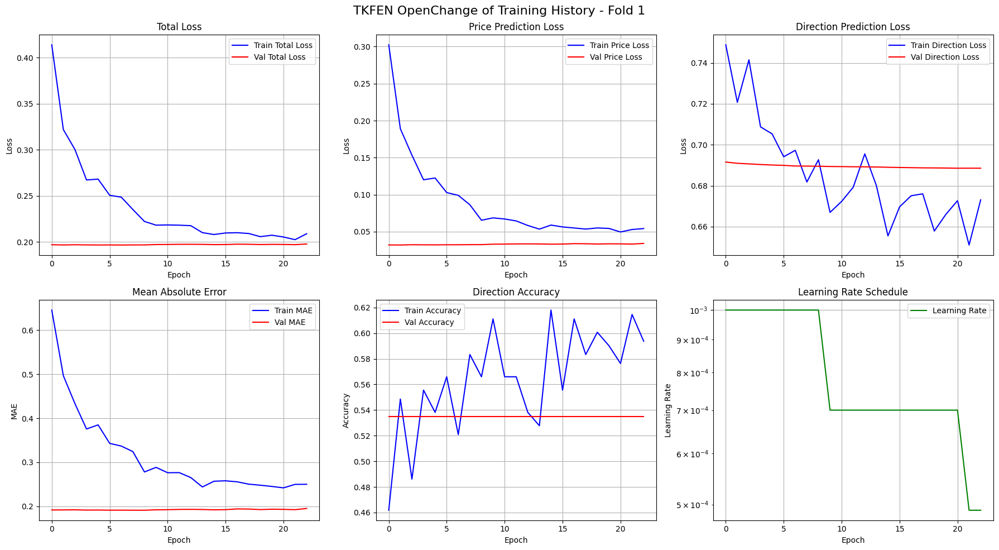

2025-05-30 00:58:32,192 [INFO] Training Enhanced Fold 2/7


Epoch 1/128
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - direction_output_binary_accuracy: 0.4972 - direction_output_loss: 0.7921 - direction_output_precision: 0.5021 - direction_output_recall: 0.4370 - loss: 0.4924 - price_output_loss: 0.3925 - price_output_mae_price: 0.7455 - price_output_mean_squared_error: 0.9966 - price_output_mean_squared_logarithmic_error: 0.2488
Epoch 1: val_loss improved from inf to 0.20673, saving model to temp_model_fold2.keras
6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 266ms/step - direction_output_binary_accuracy: 0.5000 - direction_output_loss: 0.7882 - direction_output_precision: 0.5145 - direction_output_recall: 0.4405 - loss: 0.4694 - price_output_loss: 0.3631 - price_output_mae_price: 0.7086 - price_output_mean_squared_error: 0.9106 - price_output_mean_squared_logarithmic_error: 0.2273 - val_direction_output_binary_accuracy: 0.5278 - val_direction_output_loss: 0.6927 - val_direction_output_precision: 0.5375 - val_direction_output_recall: 0.8774 - val_loss: 0.2067 - val_p

2025-05-30 00:58:48,667 [INFO] Fold 2 optimal threshold: 0.289
2025-05-30 00:58:48,671 [INFO] Fold 2 Enhanced Metrics:
2025-05-30 00:58:48,674 [INFO] Best validation loss: 0.2067 at epoch 0
2025-05-30 00:58:48,676 [INFO] Standard accuracy (0.5 threshold): 0.5278
2025-05-30 00:58:48,678 [INFO] Optimized accuracy (0.289 threshold): 0.5382
2025-05-30 00:58:48,680 [INFO] Optimized F1 score: 0.6998
2025-05-30 00:58:48,681 [INFO] Brier score: 0.2498
2025-05-30 00:58:48,682 [INFO] Calibration error: 0.0330


Plot kaydedildi: Results/OpenChange/Plotting/TKFEN/TKFEN OpenChange of training_history_fold2.png


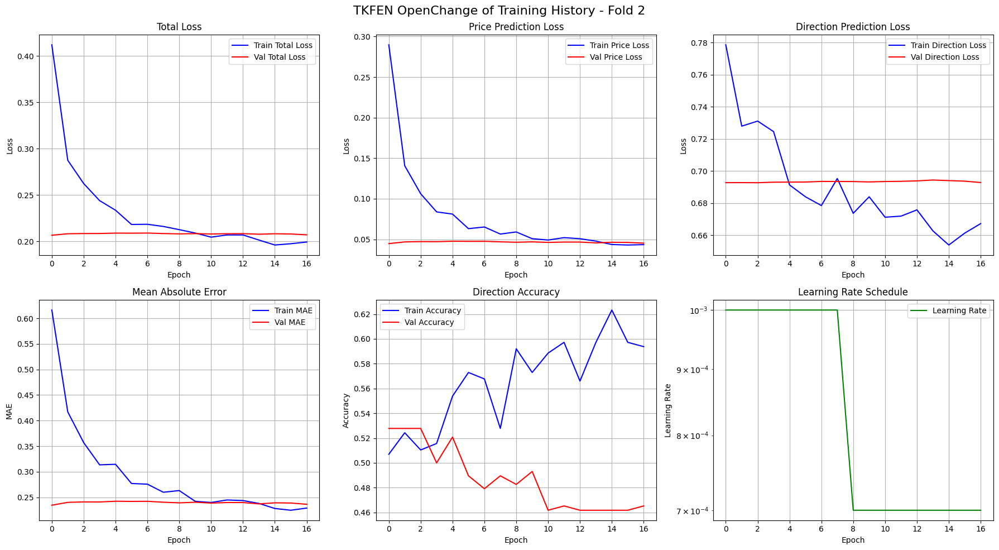

2025-05-30 00:58:51,141 [INFO] Training Enhanced Fold 3/7


Epoch 1/128
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - direction_output_binary_accuracy: 0.4975 - direction_output_loss: 0.7645 - direction_output_precision: 0.5626 - direction_output_recall: 0.3824 - loss: 0.4047 - price_output_loss: 0.2848 - price_output_mae_price: 0.6175 - price_output_mean_squared_error: 0.6708 - price_output_mean_squared_logarithmic_error: 0.1655
Epoch 1: val_loss improved from inf to 0.21308, saving model to temp_model_fold3.keras
9/9 ━━━━━━━━━━━━━━━━━━━━ 9s 208ms/step - direction_output_binary_accuracy: 0.4992 - direction_output_loss: 0.7623 - direction_output_precision: 0.5627 - direction_output_recall: 0.3844 - loss: 0.3979 - price_output_loss: 0.2765 - price_output_mae_price: 0.6059 - price_output_mean_squared_error: 0.6482 - price_output_mean_squared_logarithmic_error: 0.1600 - val_direction_output_binary_accuracy: 0.4549 - val_direction_output_loss: 0.6934 - val_direction_output_precision: 0.4596 - val_direction_output_recall: 0.9776 - val_loss: 0.2131 - val_p

2025-05-30 00:59:09,514 [INFO] Fold 3 optimal threshold: 0.289
2025-05-30 00:59:09,519 [INFO] Fold 3 Enhanced Metrics:
2025-05-30 00:59:09,520 [INFO] Best validation loss: 0.2131 at epoch 0
2025-05-30 00:59:09,520 [INFO] Standard accuracy (0.5 threshold): 0.4549
2025-05-30 00:59:09,521 [INFO] Optimized accuracy (0.289 threshold): 0.4653
2025-05-30 00:59:09,522 [INFO] Optimized F1 score: 0.6351
2025-05-30 00:59:09,522 [INFO] Brier score: 0.2501
2025-05-30 00:59:09,523 [INFO] Calibration error: 0.0508


Plot kaydedildi: Results/OpenChange/Plotting/TKFEN/TKFEN OpenChange of training_history_fold3.png


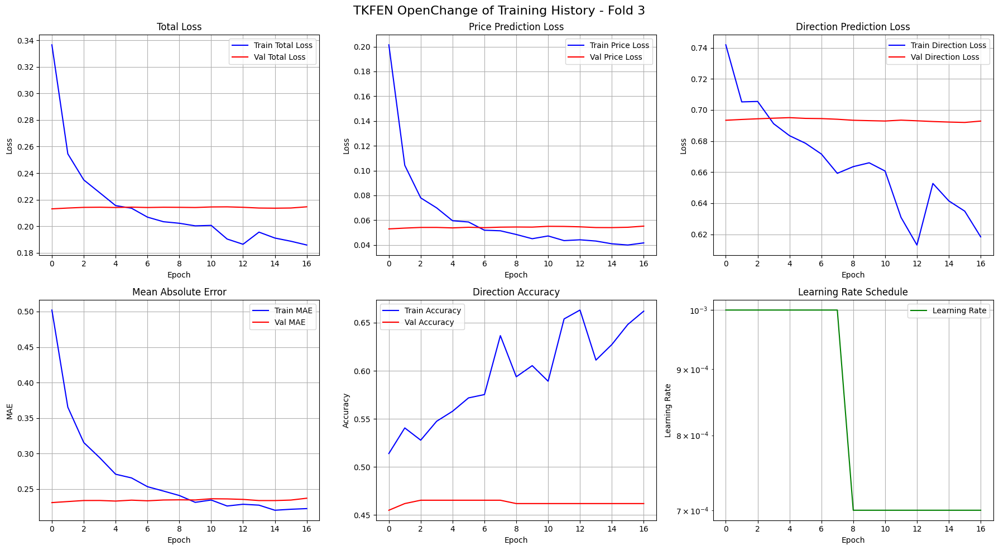

2025-05-30 00:59:13,095 [INFO] Training Enhanced Fold 4/7


Epoch 1/128
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - direction_output_binary_accuracy: 0.5522 - direction_output_loss: 0.7648 - direction_output_precision: 0.5698 - direction_output_recall: 0.5547 - loss: 0.3100 - price_output_loss: 0.1583 - price_output_mae_price: 0.4426 - price_output_mean_squared_error: 0.3401 - price_output_mean_squared_logarithmic_error: 0.0716
Epoch 1: val_loss improved from inf to 0.20107, saving model to temp_model_fold4.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - direction_output_binary_accuracy: 0.5517 - direction_output_loss: 0.7648 - direction_output_precision: 0.5693 - direction_output_recall: 0.5546 - loss: 0.3082 - price_output_loss: 0.1560 - price_output_mae_price: 0.4391 - price_output_mean_squared_error: 0.3347 - price_output_mean_squared_logarithmic_error: 0.0706 - val_direction_output_binary_accuracy: 0.4826 - val_direction_output_loss: 0.6935 - val_direction_output_precision: 0.4808 - val_direction_output_recall: 1.0000 - val_loss: 0.2011 - v

2025-05-30 01:00:22,327 [INFO] Fold 4 optimal threshold: 0.540
2025-05-30 01:00:22,332 [INFO] Fold 4 Enhanced Metrics:
2025-05-30 01:00:22,332 [INFO] Best validation loss: 0.1137 at epoch 72
2025-05-30 01:00:22,333 [INFO] Standard accuracy (0.5 threshold): 0.8299
2025-05-30 01:00:22,335 [INFO] Optimized accuracy (0.540 threshold): 0.8438
2025-05-30 01:00:22,336 [INFO] Optimized F1 score: 0.8454
2025-05-30 01:00:22,337 [INFO] Brier score: 0.1227
2025-05-30 01:00:22,338 [INFO] Calibration error: 0.0782


Plot kaydedildi: Results/OpenChange/Plotting/TKFEN/TKFEN OpenChange of training_history_fold4.png


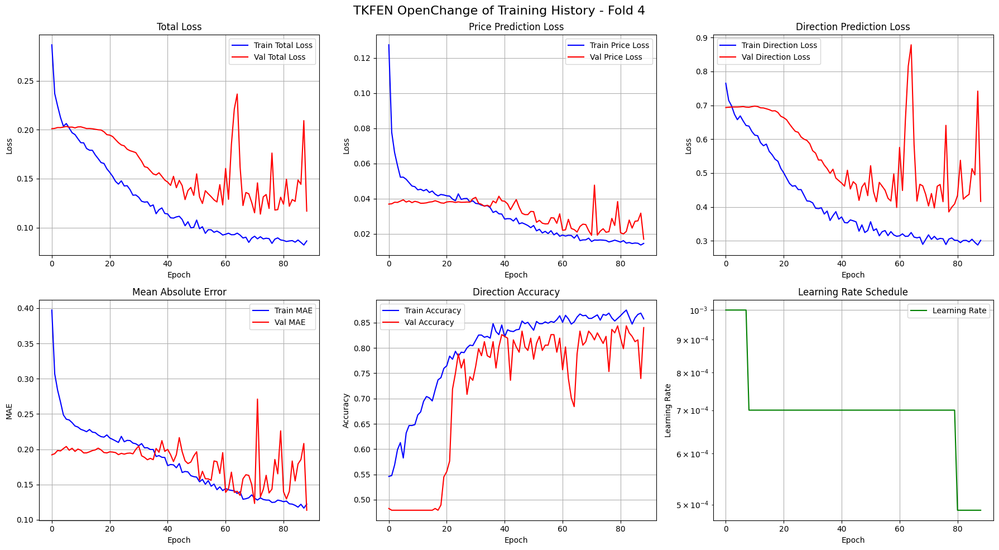

2025-05-30 01:00:24,614 [INFO] Training Enhanced Fold 5/7


Epoch 1/128
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - direction_output_binary_accuracy: 0.5272 - direction_output_loss: 0.7369 - direction_output_precision: 0.5288 - direction_output_recall: 0.3745 - loss: 0.3588 - price_output_loss: 0.2328 - price_output_mae_price: 0.5477 - price_output_mean_squared_error: 0.5177 - price_output_mean_squared_logarithmic_error: 0.1090
Epoch 1: val_loss improved from inf to 0.21797, saving model to temp_model_fold5.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - direction_output_binary_accuracy: 0.5266 - direction_output_loss: 0.7369 - direction_output_precision: 0.5294 - direction_output_recall: 0.3762 - loss: 0.3557 - price_output_loss: 0.2287 - price_output_mae_price: 0.5418 - price_output_mean_squared_error: 0.5077 - price_output_mean_squared_logarithmic_error: 0.1069 - val_direction_output_binary_accuracy: 0.5833 - val_direction_output_loss: 0.6890 - val_direction_output_precision: 0.5833 - val_direction_output_recall: 1.0000 - val_loss: 0.2180 - v

2025-05-30 01:00:48,922 [INFO] Fold 5 optimal threshold: 0.289
2025-05-30 01:00:48,926 [INFO] Fold 5 Enhanced Metrics:
2025-05-30 01:00:48,927 [INFO] Best validation loss: 0.2175 at epoch 3
2025-05-30 01:00:48,928 [INFO] Standard accuracy (0.5 threshold): 0.5729
2025-05-30 01:00:48,928 [INFO] Optimized accuracy (0.289 threshold): 0.5833
2025-05-30 01:00:48,929 [INFO] Optimized F1 score: 0.7368
2025-05-30 01:00:48,930 [INFO] Brier score: 0.2481
2025-05-30 01:00:48,930 [INFO] Calibration error: 0.0742


Plot kaydedildi: Results/OpenChange/Plotting/TKFEN/TKFEN OpenChange of training_history_fold5.png


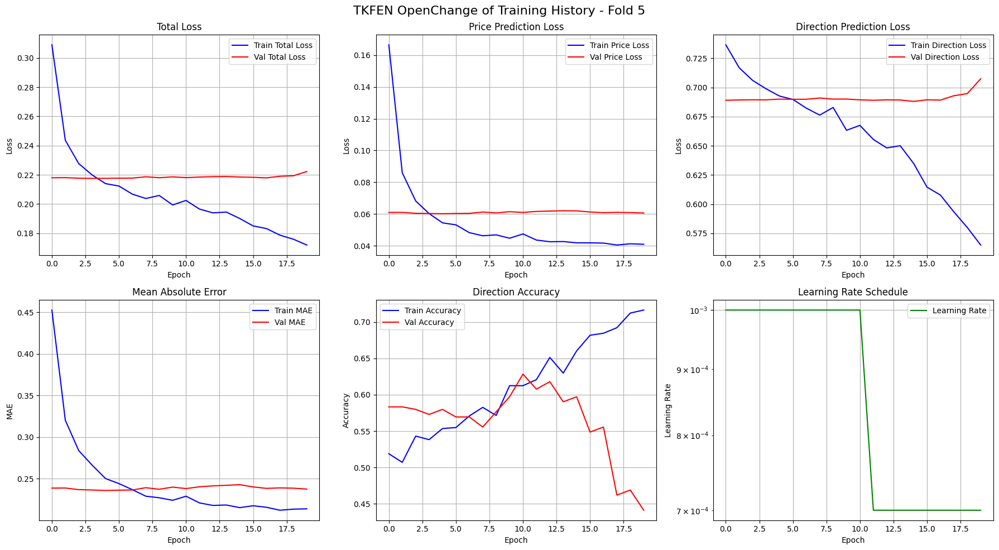

2025-05-30 01:00:51,414 [INFO] Training Enhanced Fold 6/7


Epoch 1/128
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - direction_output_binary_accuracy: 0.4534 - direction_output_loss: 0.8189 - direction_output_precision: 0.4784 - direction_output_recall: 0.5673 - loss: 0.3672 - price_output_loss: 0.2166 - price_output_mae_price: 0.5190 - price_output_mean_squared_error: 0.4843 - price_output_mean_squared_logarithmic_error: 0.0989
Epoch 1: val_loss improved from inf to 0.24556, saving model to temp_model_fold6.keras
18/18 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - direction_output_binary_accuracy: 0.4565 - direction_output_loss: 0.8157 - direction_output_precision: 0.4811 - direction_output_recall: 0.5711 - loss: 0.3614 - price_output_loss: 0.2100 - price_output_mae_price: 0.5093 - price_output_mean_squared_error: 0.4684 - price_output_mean_squared_logarithmic_error: 0.0960 - val_direction_output_binary_accuracy: 0.4792 - val_direction_output_loss: 0.6974 - val_direction_output_precision: 0.0000e+00 - val_direction_output_recall: 0.0000e+00 - val_loss: 0.2

2025-05-30 01:02:19,026 [INFO] Fold 6 optimal threshold: 0.348
2025-05-30 01:02:19,031 [INFO] Fold 6 Enhanced Metrics:
2025-05-30 01:02:19,033 [INFO] Best validation loss: 0.1147 at epoch 65
2025-05-30 01:02:19,034 [INFO] Standard accuracy (0.5 threshold): 0.8576
2025-05-30 01:02:19,034 [INFO] Optimized accuracy (0.348 threshold): 0.8715
2025-05-30 01:02:19,035 [INFO] Optimized F1 score: 0.8847
2025-05-30 01:02:19,036 [INFO] Brier score: 0.1036
2025-05-30 01:02:19,037 [INFO] Calibration error: 0.0629


Plot kaydedildi: Results/OpenChange/Plotting/TKFEN/TKFEN OpenChange of training_history_fold6.png


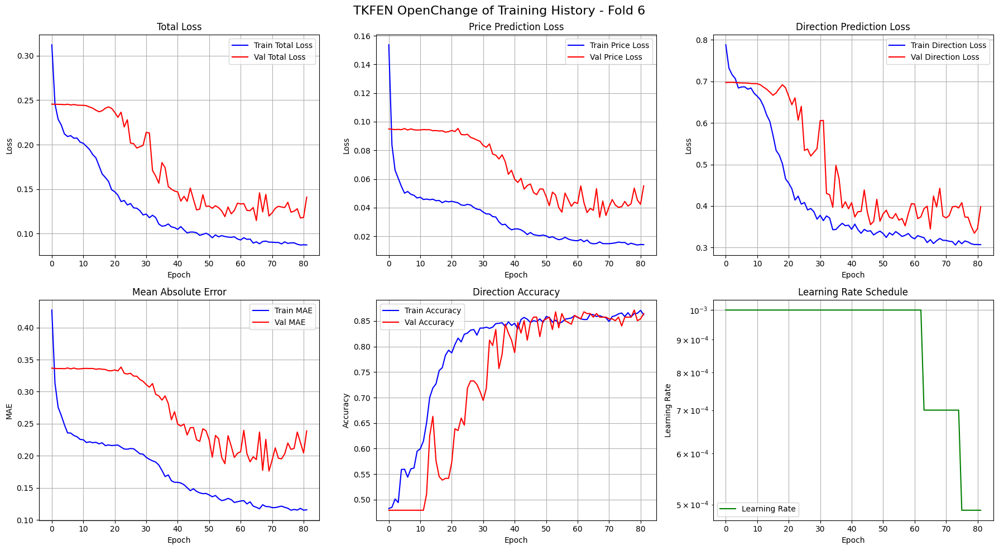

2025-05-30 01:02:22,254 [INFO] Training Enhanced Fold 7/7


Epoch 1/128
19/21 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - direction_output_binary_accuracy: 0.4759 - direction_output_loss: 0.7721 - direction_output_precision: 0.5002 - direction_output_recall: 0.3499 - loss: 0.4574 - price_output_loss: 0.3525 - price_output_mae_price: 0.6881 - price_output_mean_squared_error: 0.9115 - price_output_mean_squared_logarithmic_error: 0.1657
Epoch 1: val_loss improved from inf to 3.19574, saving model to temp_model_fold7.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - direction_output_binary_accuracy: 0.4761 - direction_output_loss: 0.7691 - direction_output_precision: 0.4998 - direction_output_recall: 0.3529 - loss: 0.4441 - price_output_loss: 0.3358 - price_output_mae_price: 0.6669 - price_output_mean_squared_error: 0.8615 - price_output_mean_squared_logarithmic_error: 0.1575 - val_direction_output_binary_accuracy: 0.5208 - val_direction_output_loss: 0.6922 - val_direction_output_precision: 0.5208 - val_direction_output_recall: 1.0000 - val_loss: 3.1957 - va

2025-05-30 01:04:13,983 [INFO] Fold 7 optimal threshold: 0.407
2025-05-30 01:04:13,988 [INFO] Fold 7 Enhanced Metrics:
2025-05-30 01:04:13,989 [INFO] Best validation loss: 3.1141 at epoch 77
2025-05-30 01:04:13,990 [INFO] Standard accuracy (0.5 threshold): 0.8507
2025-05-30 01:04:13,991 [INFO] Optimized accuracy (0.407 threshold): 0.8715
2025-05-30 01:04:13,992 [INFO] Optimized F1 score: 0.8810
2025-05-30 01:04:13,993 [INFO] Brier score: 0.1019
2025-05-30 01:04:13,993 [INFO] Calibration error: 0.0538


Plot kaydedildi: Results/OpenChange/Plotting/TKFEN/TKFEN OpenChange of training_history_fold7.png


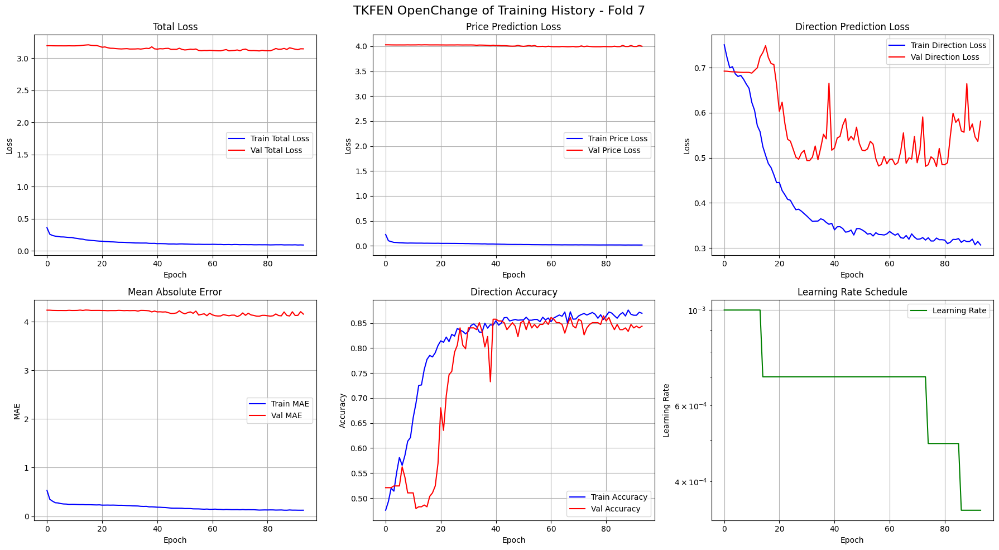

2025-05-30 01:04:16,423 [INFO] ENHANCED MODEL EVALUATION WITH THRESHOLD OPTIMIZATION & CALIBRATION
2025-05-30 01:04:16,423 [INFO] Global optimal threshold: 0.383
2025-05-30 01:04:16,424 [INFO] Fold 1 Enhanced Results:
2025-05-30 01:04:16,427 [INFO] Validation Loss: 0.1967
2025-05-30 01:04:16,428 [INFO] Price MAE: 0.1913
2025-05-30 01:04:16,428 [INFO] Standard Accuracy (0.5): 0.5347
2025-05-30 01:04:16,429 [INFO] Optimized Accuracy (0.289): 0.5347
2025-05-30 01:04:16,430 [INFO] Optimized F1: 0.6968
2025-05-30 01:04:16,431 [INFO] Brier Score: 0.2482
2025-05-30 01:04:16,431 [INFO] Calibration Error: 0.0063
2025-05-30 01:04:16,432 [INFO] Fold 2 Enhanced Results:
2025-05-30 01:04:16,433 [INFO] Validation Loss: 0.2067
2025-05-30 01:04:16,434 [INFO] Price MAE: 0.2347
2025-05-30 01:04:16,437 [INFO] Standard Accuracy (0.5): 0.5278
2025-05-30 01:04:16,437 [INFO] Optimized Accuracy (0.289): 0.5382
2025-05-30 01:04:16,438 [INFO] Optimized F1: 0.6998
2025-05-30 01:04:16,439 [INFO] Brier Score: 0.24

Epoch 1/128
2/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - direction_output_binary_accuracy: 0.5469 - direction_output_loss: 0.7334 - direction_output_precision: 0.6259 - direction_output_recall: 0.5587 - loss: 0.4714 - price_output_loss: 0.3841 - price_output_mae_price: 0.7229 - price_output_mean_squared_error: 0.9722 - price_output_mean_squared_logarithmic_error: 0.1622
Epoch 1: val_loss improved from inf to 0.18605, saving model to temp_model_fold1.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 803ms/step - direction_output_binary_accuracy: 0.5373 - direction_output_loss: 0.7344 - direction_output_precision: 0.5819 - direction_output_recall: 0.5665 - loss: 0.4404 - price_output_loss: 0.3424 - price_output_mae_price: 0.6774 - price_output_mean_squared_error: 0.8478 - price_output_mean_squared_logarithmic_error: 0.1474 - val_direction_output_binary_accuracy: 0.5278 - val_direction_output_loss: 0.6926 - val_direction_output_precision: 0.5286 - val_direction_output_recall: 0.9737 - val_loss: 0.1860 - val_p

2025-05-30 01:05:32,931 [INFO] Fold 1 optimal threshold: 0.522
2025-05-30 01:05:32,936 [INFO] Fold 1 Enhanced Metrics:
2025-05-30 01:05:32,940 [INFO] Best validation loss: 0.1684 at epoch 127
2025-05-30 01:05:32,941 [INFO] Standard accuracy (0.5 threshold): 0.7222
2025-05-30 01:05:32,941 [INFO] Optimized accuracy (0.522 threshold): 0.7708
2025-05-30 01:05:32,942 [INFO] Optimized F1 score: 0.7975
2025-05-30 01:05:32,945 [INFO] Brier score: 0.2100
2025-05-30 01:05:32,945 [INFO] Calibration error: 0.1516


Plot kaydedildi: Results/OpenChange/Plotting/TOASO/TOASO OpenChange of training_history_fold1.png


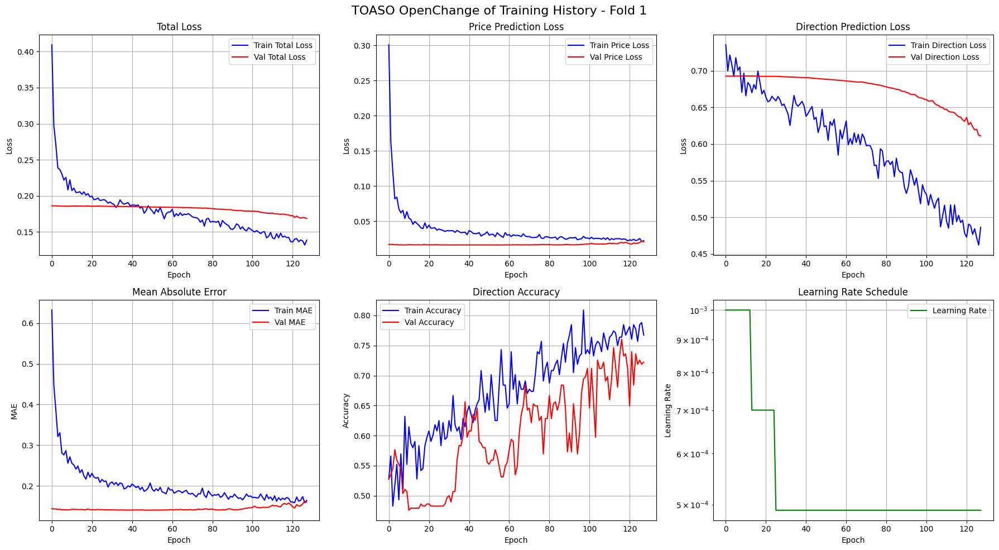

2025-05-30 01:05:35,460 [INFO] Training Enhanced Fold 2/7


Epoch 1/128
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - direction_output_binary_accuracy: 0.4876 - direction_output_loss: 0.7682 - direction_output_precision: 0.4978 - direction_output_recall: 0.4487 - loss: 0.4749 - price_output_loss: 0.3771 - price_output_mae_price: 0.7241 - price_output_mean_squared_error: 0.9231 - price_output_mean_squared_logarithmic_error: 0.1494
Epoch 1: val_loss improved from inf to 0.20508, saving model to temp_model_fold2.keras
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - direction_output_binary_accuracy: 0.4917 - direction_output_loss: 0.7661 - direction_output_precision: 0.5058 - direction_output_recall: 0.4462 - loss: 0.4546 - price_output_loss: 0.3508 - price_output_mae_price: 0.6909 - price_output_mean_squared_error: 0.8543 - price_output_mean_squared_logarithmic_error: 0.1383 - val_direction_output_binary_accuracy: 0.5347 - val_direction_output_loss: 0.6921 - val_direction_output_precision: 0.5135 - val_direction_output_recall: 0.9433 - val_loss: 0.2051 - val_p

2025-05-30 01:06:03,866 [INFO] Fold 2 optimal threshold: 0.289
2025-05-30 01:06:03,870 [INFO] Fold 2 Enhanced Metrics:
2025-05-30 01:06:03,872 [INFO] Best validation loss: 0.2038 at epoch 21
2025-05-30 01:06:03,872 [INFO] Standard accuracy (0.5 threshold): 0.5382
2025-05-30 01:06:03,873 [INFO] Optimized accuracy (0.289 threshold): 0.4896
2025-05-30 01:06:03,874 [INFO] Optimized F1 score: 0.6573
2025-05-30 01:06:03,875 [INFO] Brier score: 0.2473
2025-05-30 01:06:03,876 [INFO] Calibration error: 0.0236


Plot kaydedildi: Results/OpenChange/Plotting/TOASO/TOASO OpenChange of training_history_fold2.png


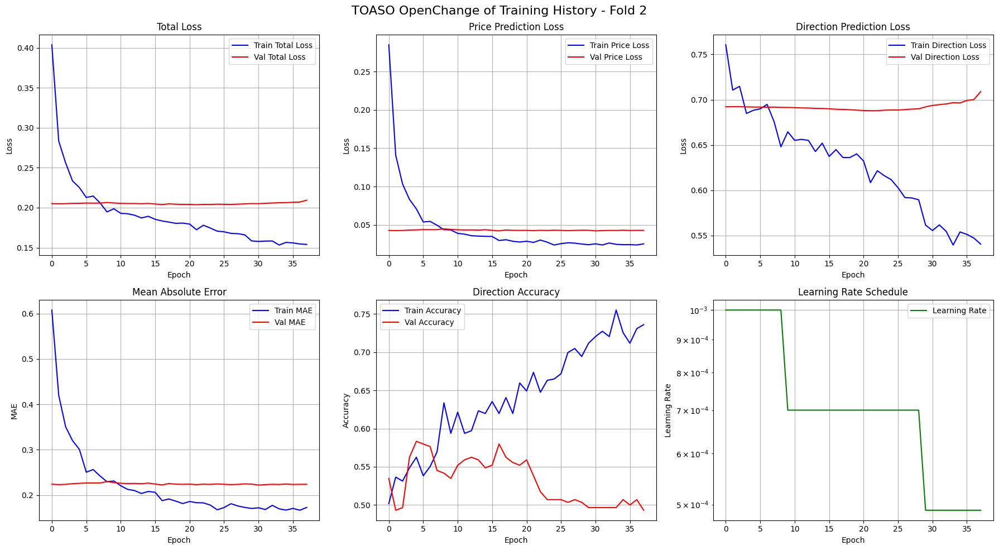

2025-05-30 01:06:06,802 [INFO] Training Enhanced Fold 3/7


Epoch 1/128
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - direction_output_binary_accuracy: 0.5564 - direction_output_loss: 0.7383 - direction_output_precision: 0.5743 - direction_output_recall: 0.5594 - loss: 0.3781 - price_output_loss: 0.2581 - price_output_mae_price: 0.5734 - price_output_mean_squared_error: 0.5706 - price_output_mean_squared_logarithmic_error: 0.0992
Epoch 1: val_loss improved from inf to 0.21720, saving model to temp_model_fold3.keras
9/9 ━━━━━━━━━━━━━━━━━━━━ 8s 179ms/step - direction_output_binary_accuracy: 0.5538 - direction_output_loss: 0.7413 - direction_output_precision: 0.5709 - direction_output_recall: 0.5566 - loss: 0.3751 - price_output_loss: 0.2531 - price_output_mae_price: 0.5665 - price_output_mean_squared_error: 0.5588 - price_output_mean_squared_logarithmic_error: 0.0974 - val_direction_output_binary_accuracy: 0.5312 - val_direction_output_loss: 0.6925 - val_direction_output_precision: 0.6250 - val_direction_output_recall: 0.0719 - val_loss: 0.2172 - val_p

2025-05-30 01:06:36,798 [INFO] Fold 3 optimal threshold: 0.289
2025-05-30 01:06:36,802 [INFO] Fold 3 Enhanced Metrics:
2025-05-30 01:06:36,803 [INFO] Best validation loss: 0.2157 at epoch 14
2025-05-30 01:06:36,804 [INFO] Standard accuracy (0.5 threshold): 0.5243
2025-05-30 01:06:36,804 [INFO] Optimized accuracy (0.289 threshold): 0.4826
2025-05-30 01:06:36,805 [INFO] Optimized F1 score: 0.6511
2025-05-30 01:06:36,805 [INFO] Brier score: 0.2467
2025-05-30 01:06:36,806 [INFO] Calibration error: 0.0362


Plot kaydedildi: Results/OpenChange/Plotting/TOASO/TOASO OpenChange of training_history_fold3.png


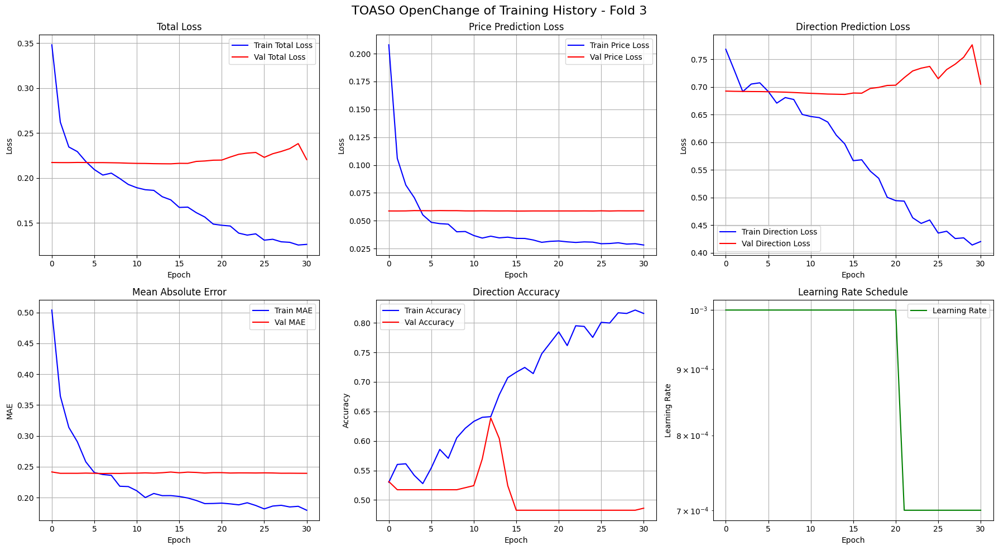

2025-05-30 01:06:39,393 [INFO] Training Enhanced Fold 4/7


Epoch 1/128
11/12 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - direction_output_binary_accuracy: 0.5118 - direction_output_loss: 0.7384 - direction_output_precision: 0.5253 - direction_output_recall: 0.2328 - loss: 0.4524 - price_output_loss: 0.3571 - price_output_mae_price: 0.6943 - price_output_mean_squared_error: 0.8960 - price_output_mean_squared_logarithmic_error: 0.1964
Epoch 1: val_loss improved from inf to 0.20964, saving model to temp_model_fold4.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 8s 184ms/step - direction_output_binary_accuracy: 0.5101 - direction_output_loss: 0.7378 - direction_output_precision: 0.5227 - direction_output_recall: 0.2362 - loss: 0.4398 - price_output_loss: 0.3404 - price_output_mae_price: 0.6739 - price_output_mean_squared_error: 0.8473 - price_output_mean_squared_logarithmic_error: 0.1861 - val_direction_output_binary_accuracy: 0.5139 - val_direction_output_loss: 0.6930 - val_direction_output_precision: 0.5139 - val_direction_output_recall: 1.0000 - val_loss: 0.2096 - v

2025-05-30 01:08:28,643 [INFO] Fold 4 optimal threshold: 0.406
2025-05-30 01:08:28,648 [INFO] Fold 4 Enhanced Metrics:
2025-05-30 01:08:28,649 [INFO] Best validation loss: 0.1129 at epoch 111
2025-05-30 01:08:28,650 [INFO] Standard accuracy (0.5 threshold): 0.8681
2025-05-30 01:08:28,650 [INFO] Optimized accuracy (0.406 threshold): 0.8472
2025-05-30 01:08:28,651 [INFO] Optimized F1 score: 0.8634
2025-05-30 01:08:28,652 [INFO] Brier score: 0.1051
2025-05-30 01:08:28,653 [INFO] Calibration error: 0.0506


Plot kaydedildi: Results/OpenChange/Plotting/TOASO/TOASO OpenChange of training_history_fold4.png


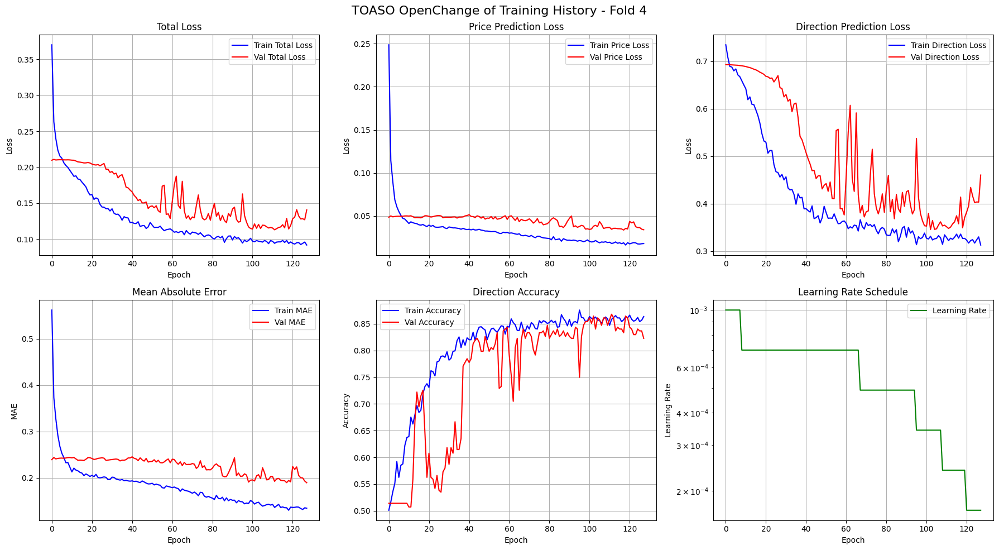

2025-05-30 01:08:31,188 [INFO] Training Enhanced Fold 5/7


Epoch 1/128
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - direction_output_binary_accuracy: 0.5062 - direction_output_loss: 0.7313 - direction_output_precision: 0.5126 - direction_output_recall: 0.5687 - loss: 0.3407 - price_output_loss: 0.2105 - price_output_mae_price: 0.5069 - price_output_mean_squared_error: 0.4799 - price_output_mean_squared_logarithmic_error: 0.0683
Epoch 1: val_loss improved from inf to 0.22807, saving model to temp_model_fold5.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 8s 111ms/step - direction_output_binary_accuracy: 0.5065 - direction_output_loss: 0.7307 - direction_output_precision: 0.5128 - direction_output_recall: 0.5700 - loss: 0.3379 - price_output_loss: 0.2070 - price_output_mae_price: 0.5021 - price_output_mean_squared_error: 0.4708 - price_output_mean_squared_logarithmic_error: 0.0676 - val_direction_output_binary_accuracy: 0.5729 - val_direction_output_loss: 0.6903 - val_direction_output_precision: 0.5729 - val_direction_output_recall: 1.0000 - val_loss: 0.2281 - v

2025-05-30 01:10:16,641 [INFO] Fold 5 optimal threshold: 0.342
2025-05-30 01:10:16,647 [INFO] Fold 5 Enhanced Metrics:
2025-05-30 01:10:16,648 [INFO] Best validation loss: 0.1204 at epoch 79
2025-05-30 01:10:16,649 [INFO] Standard accuracy (0.5 threshold): 0.8403
2025-05-30 01:10:16,650 [INFO] Optimized accuracy (0.342 threshold): 0.8403
2025-05-30 01:10:16,651 [INFO] Optimized F1 score: 0.8655
2025-05-30 01:10:16,652 [INFO] Brier score: 0.1165
2025-05-30 01:10:16,653 [INFO] Calibration error: 0.0623


Plot kaydedildi: Results/OpenChange/Plotting/TOASO/TOASO OpenChange of training_history_fold5.png


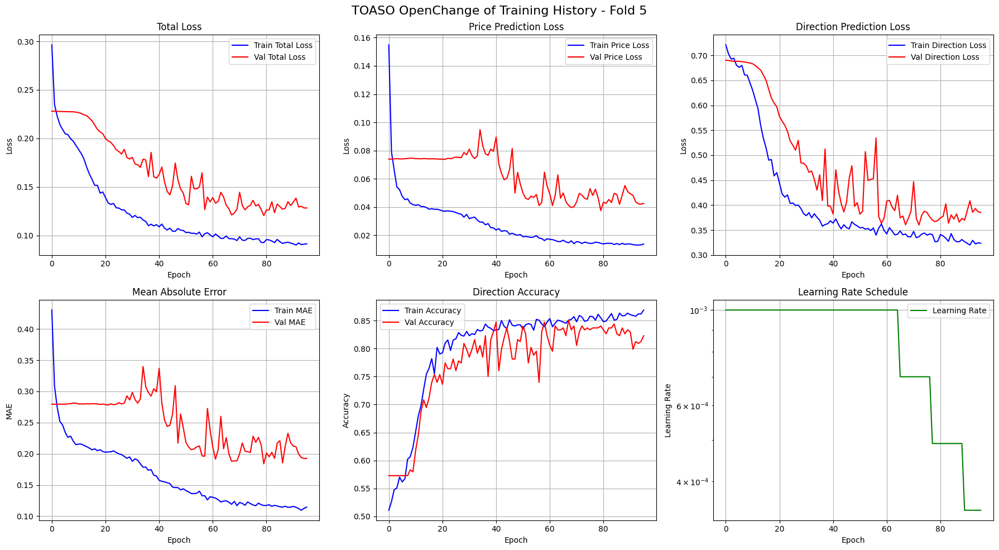

2025-05-30 01:10:19,354 [INFO] Training Enhanced Fold 6/7


Epoch 1/128
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - direction_output_binary_accuracy: 0.5114 - direction_output_loss: 0.7530 - direction_output_precision: 0.5319 - direction_output_recall: 0.4502 - loss: 0.4381 - price_output_loss: 0.3332 - price_output_mae_price: 0.6613 - price_output_mean_squared_error: 0.8662 - price_output_mean_squared_logarithmic_error: 0.0633
Epoch 1: val_loss improved from inf to 0.24402, saving model to temp_model_fold6.keras
18/18 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - direction_output_binary_accuracy: 0.5119 - direction_output_loss: 0.7524 - direction_output_precision: 0.5324 - direction_output_recall: 0.4516 - loss: 0.4290 - price_output_loss: 0.3211 - price_output_mae_price: 0.6462 - price_output_mean_squared_error: 0.8296 - price_output_mean_squared_logarithmic_error: 0.0631 - val_direction_output_binary_accuracy: 0.4618 - val_direction_output_loss: 0.6941 - val_direction_output_precision: 0.2500 - val_direction_output_recall: 0.0065 - val_loss: 0.2440 - va

2025-05-30 01:11:53,711 [INFO] Fold 6 optimal threshold: 0.452
2025-05-30 01:11:53,721 [INFO] Fold 6 Enhanced Metrics:
2025-05-30 01:11:53,726 [INFO] Best validation loss: 0.1273 at epoch 59
2025-05-30 01:11:53,726 [INFO] Standard accuracy (0.5 threshold): 0.8438
2025-05-30 01:11:53,727 [INFO] Optimized accuracy (0.452 threshold): 0.8507
2025-05-30 01:11:53,728 [INFO] Optimized F1 score: 0.8626
2025-05-30 01:11:53,728 [INFO] Brier score: 0.1148
2025-05-30 01:11:53,730 [INFO] Calibration error: 0.0805


Plot kaydedildi: Results/OpenChange/Plotting/TOASO/TOASO OpenChange of training_history_fold6.png


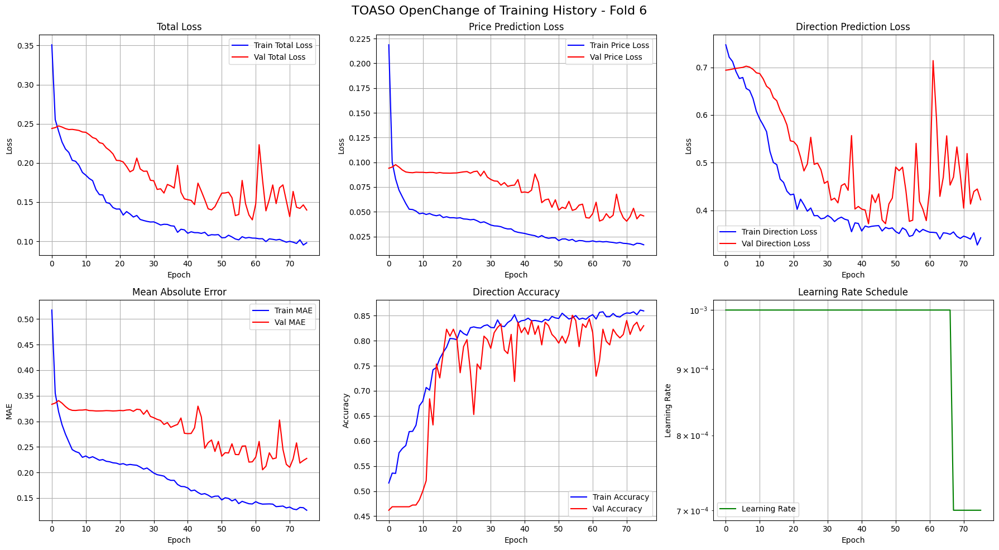

2025-05-30 01:11:57,037 [INFO] Training Enhanced Fold 7/7


Epoch 1/128
20/21 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - direction_output_binary_accuracy: 0.5447 - direction_output_loss: 0.7211 - direction_output_precision: 0.5846 - direction_output_recall: 0.5178 - loss: 0.3436 - price_output_loss: 0.2177 - price_output_mae_price: 0.5264 - price_output_mean_squared_error: 0.4785 - price_output_mean_squared_logarithmic_error: 0.0826
Epoch 1: val_loss improved from inf to 0.20222, saving model to temp_model_fold7.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - direction_output_binary_accuracy: 0.5432 - direction_output_loss: 0.7215 - direction_output_precision: 0.5814 - direction_output_recall: 0.5163 - loss: 0.3398 - price_output_loss: 0.2125 - price_output_mae_price: 0.5186 - price_output_mean_squared_error: 0.4659 - price_output_mean_squared_logarithmic_error: 0.0810 - val_direction_output_binary_accuracy: 0.5104 - val_direction_output_loss: 0.6921 - val_direction_output_precision: 0.0000e+00 - val_direction_output_recall: 0.0000e+00 - val_loss: 0.2

2025-05-30 01:13:56,560 [INFO] Fold 7 optimal threshold: 0.599
2025-05-30 01:13:56,565 [INFO] Fold 7 Enhanced Metrics:
2025-05-30 01:13:56,568 [INFO] Best validation loss: 0.0970 at epoch 74
2025-05-30 01:13:56,569 [INFO] Standard accuracy (0.5 threshold): 0.8715
2025-05-30 01:13:56,569 [INFO] Optimized accuracy (0.599 threshold): 0.8646
2025-05-30 01:13:56,570 [INFO] Optimized F1 score: 0.8592
2025-05-30 01:13:56,571 [INFO] Brier score: 0.1055
2025-05-30 01:13:56,571 [INFO] Calibration error: 0.0405


Plot kaydedildi: Results/OpenChange/Plotting/TOASO/TOASO OpenChange of training_history_fold7.png


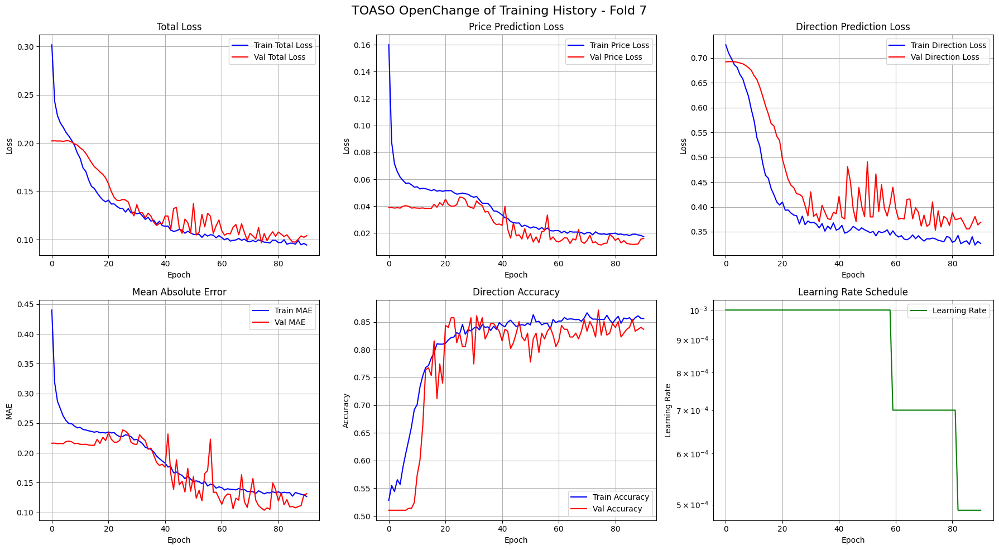

2025-05-30 01:13:59,283 [INFO] ENHANCED MODEL EVALUATION WITH THRESHOLD OPTIMIZATION & CALIBRATION
2025-05-30 01:13:59,284 [INFO] Global optimal threshold: 0.513
2025-05-30 01:13:59,285 [INFO] Fold 1 Enhanced Results:
2025-05-30 01:13:59,287 [INFO] Validation Loss: 0.1684
2025-05-30 01:13:59,288 [INFO] Price MAE: 0.1601
2025-05-30 01:13:59,289 [INFO] Standard Accuracy (0.5): 0.7222
2025-05-30 01:13:59,290 [INFO] Optimized Accuracy (0.522): 0.7708
2025-05-30 01:13:59,291 [INFO] Optimized F1: 0.7975
2025-05-30 01:13:59,291 [INFO] Brier Score: 0.2100
2025-05-30 01:13:59,292 [INFO] Calibration Error: 0.1516
2025-05-30 01:13:59,293 [INFO] Fold 2 Enhanced Results:
2025-05-30 01:13:59,295 [INFO] Validation Loss: 0.2038
2025-05-30 01:13:59,296 [INFO] Price MAE: 0.2232
2025-05-30 01:13:59,297 [INFO] Standard Accuracy (0.5): 0.5382
2025-05-30 01:13:59,298 [INFO] Optimized Accuracy (0.289): 0.4896
2025-05-30 01:13:59,298 [INFO] Optimized F1: 0.6573
2025-05-30 01:13:59,299 [INFO] Brier Score: 0.24

Epoch 1/128
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - direction_output_binary_accuracy: 0.5417 - direction_output_loss: 0.7298 - direction_output_precision: 0.5980 - direction_output_recall: 0.4562 - loss: 0.4914 - price_output_loss: 0.4119 - price_output_mae_price: 0.7594 - price_output_mean_squared_error: 1.0773 - price_output_mean_squared_logarithmic_error: 0.2630
Epoch 1: val_loss improved from inf to 0.19056, saving model to temp_model_fold1.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 944ms/step - direction_output_binary_accuracy: 0.5339 - direction_output_loss: 0.7351 - direction_output_precision: 0.5867 - direction_output_recall: 0.4526 - loss: 0.4745 - price_output_loss: 0.3876 - price_output_mae_price: 0.7310 - price_output_mean_squared_error: 1.0020 - price_output_mean_squared_logarithmic_error: 0.2468 - val_direction_output_binary_accuracy: 0.5833 - val_direction_output_loss: 0.6911 - val_direction_output_precision: 0.5786 - val_direction_output_recall: 0.9878 - val_loss: 0.1906 - val_p

2025-05-30 01:15:05,941 [INFO] Fold 1 optimal threshold: 0.594
2025-05-30 01:15:05,946 [INFO] Fold 1 Enhanced Metrics:
2025-05-30 01:15:05,947 [INFO] Best validation loss: 0.1768 at epoch 75
2025-05-30 01:15:05,948 [INFO] Standard accuracy (0.5 threshold): 0.5903
2025-05-30 01:15:05,949 [INFO] Optimized accuracy (0.594 threshold): 0.7326
2025-05-30 01:15:05,949 [INFO] Optimized F1 score: 0.7794
2025-05-30 01:15:05,950 [INFO] Brier score: 0.2236
2025-05-30 01:15:05,950 [INFO] Calibration error: 0.1713


Plot kaydedildi: Results/OpenChange/Plotting/TUPRS/TUPRS OpenChange of training_history_fold1.png


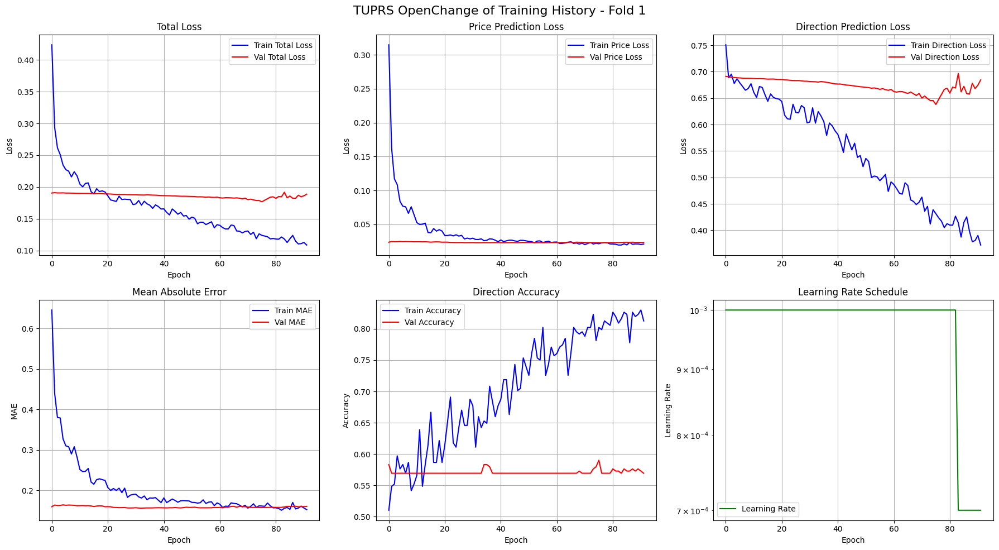

2025-05-30 01:15:08,414 [INFO] Training Enhanced Fold 2/7


Epoch 1/128
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - direction_output_binary_accuracy: 0.4569 - direction_output_loss: 0.8599 - direction_output_precision: 0.5283 - direction_output_recall: 0.1853 - loss: 0.4685 - price_output_loss: 0.3380 - price_output_mae_price: 0.6895 - price_output_mean_squared_error: 0.7905 - price_output_mean_squared_logarithmic_error: 0.1314
Epoch 1: val_loss improved from inf to 0.21106, saving model to temp_model_fold2.keras
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - direction_output_binary_accuracy: 0.4593 - direction_output_loss: 0.8533 - direction_output_precision: 0.5325 - direction_output_recall: 0.1889 - loss: 0.4515 - price_output_loss: 0.3176 - price_output_mae_price: 0.6638 - price_output_mean_squared_error: 0.7372 - price_output_mean_squared_logarithmic_error: 0.1247 - val_direction_output_binary_accuracy: 0.5208 - val_direction_output_loss: 0.6922 - val_direction_output_precision: 0.5294 - val_direction_output_recall: 0.9351 - val_loss: 0.2111 - val_p

2025-05-30 01:16:29,956 [INFO] Fold 2 optimal threshold: 0.519
2025-05-30 01:16:29,960 [INFO] Fold 2 Enhanced Metrics:
2025-05-30 01:16:29,961 [INFO] Best validation loss: 0.1504 at epoch 106
2025-05-30 01:16:29,962 [INFO] Standard accuracy (0.5 threshold): 0.8333
2025-05-30 01:16:29,962 [INFO] Optimized accuracy (0.519 threshold): 0.8368
2025-05-30 01:16:29,963 [INFO] Optimized F1 score: 0.8459
2025-05-30 01:16:29,964 [INFO] Brier score: 0.1297
2025-05-30 01:16:29,965 [INFO] Calibration error: 0.0882


Plot kaydedildi: Results/OpenChange/Plotting/TUPRS/TUPRS OpenChange of training_history_fold2.png


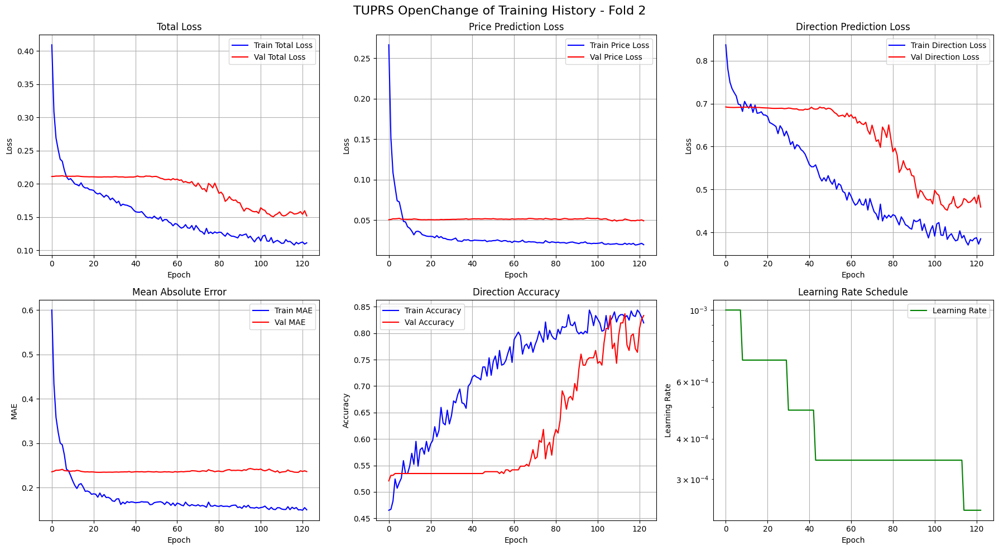

2025-05-30 01:16:33,645 [INFO] Training Enhanced Fold 3/7


Epoch 1/128
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - direction_output_binary_accuracy: 0.4706 - direction_output_loss: 0.7483 - direction_output_precision: 0.5178 - direction_output_recall: 0.5522 - loss: 0.3607 - price_output_loss: 0.2315 - price_output_mae_price: 0.5550 - price_output_mean_squared_error: 0.5028 - price_output_mean_squared_logarithmic_error: 0.0537
Epoch 1: val_loss improved from inf to 0.21362, saving model to temp_model_fold3.keras
9/9 ━━━━━━━━━━━━━━━━━━━━ 8s 185ms/step - direction_output_binary_accuracy: 0.4735 - direction_output_loss: 0.7468 - direction_output_precision: 0.5199 - direction_output_recall: 0.5563 - loss: 0.3572 - price_output_loss: 0.2274 - price_output_mae_price: 0.5490 - price_output_mean_squared_error: 0.4931 - price_output_mean_squared_logarithmic_error: 0.0540 - val_direction_output_binary_accuracy: 0.5417 - val_direction_output_loss: 0.6909 - val_direction_output_precision: 0.5000 - val_direction_output_recall: 0.0076 - val_loss: 0.2136 - val_p

2025-05-30 01:17:51,148 [INFO] Fold 3 optimal threshold: 0.304
2025-05-30 01:17:51,153 [INFO] Fold 3 Enhanced Metrics:
2025-05-30 01:17:51,155 [INFO] Best validation loss: 0.1685 at epoch 72
2025-05-30 01:17:51,156 [INFO] Standard accuracy (0.5 threshold): 0.7639
2025-05-30 01:17:51,157 [INFO] Optimized accuracy (0.304 threshold): 0.7743
2025-05-30 01:17:51,158 [INFO] Optimized F1 score: 0.7735
2025-05-30 01:17:51,159 [INFO] Brier score: 0.1661
2025-05-30 01:17:51,160 [INFO] Calibration error: 0.0763


Plot kaydedildi: Results/OpenChange/Plotting/TUPRS/TUPRS OpenChange of training_history_fold3.png


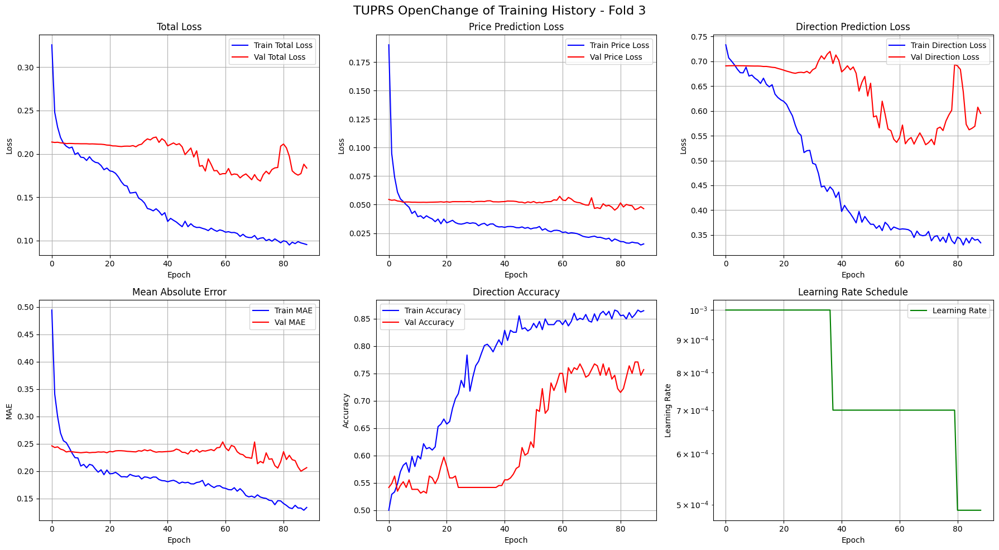

2025-05-30 01:17:53,658 [INFO] Training Enhanced Fold 4/7


Epoch 1/128
11/12 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - direction_output_binary_accuracy: 0.5523 - direction_output_loss: 0.7555 - direction_output_precision: 0.5790 - direction_output_recall: 0.5440 - loss: 0.4334 - price_output_loss: 0.3260 - price_output_mae_price: 0.6638 - price_output_mean_squared_error: 0.7941 - price_output_mean_squared_logarithmic_error: 0.0662
Epoch 1: val_loss improved from inf to 0.21095, saving model to temp_model_fold4.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - direction_output_binary_accuracy: 0.5504 - direction_output_loss: 0.7552 - direction_output_precision: 0.5768 - direction_output_recall: 0.5423 - loss: 0.4213 - price_output_loss: 0.3100 - price_output_mae_price: 0.6430 - price_output_mean_squared_error: 0.7498 - price_output_mean_squared_logarithmic_error: 0.0653 - val_direction_output_binary_accuracy: 0.4896 - val_direction_output_loss: 0.6935 - val_direction_output_precision: 0.4896 - val_direction_output_recall: 1.0000 - val_loss: 0.2110 - v

2025-05-30 01:19:58,387 [INFO] Fold 4 optimal threshold: 0.390
2025-05-30 01:19:58,397 [INFO] Fold 4 Enhanced Metrics:
2025-05-30 01:19:58,398 [INFO] Best validation loss: 0.1144 at epoch 102
2025-05-30 01:19:58,398 [INFO] Standard accuracy (0.5 threshold): 0.8438
2025-05-30 01:19:58,399 [INFO] Optimized accuracy (0.390 threshold): 0.8368
2025-05-30 01:19:58,402 [INFO] Optimized F1 score: 0.8439
2025-05-30 01:19:58,403 [INFO] Brier score: 0.1189
2025-05-30 01:19:58,403 [INFO] Calibration error: 0.0555


Plot kaydedildi: Results/OpenChange/Plotting/TUPRS/TUPRS OpenChange of training_history_fold4.png


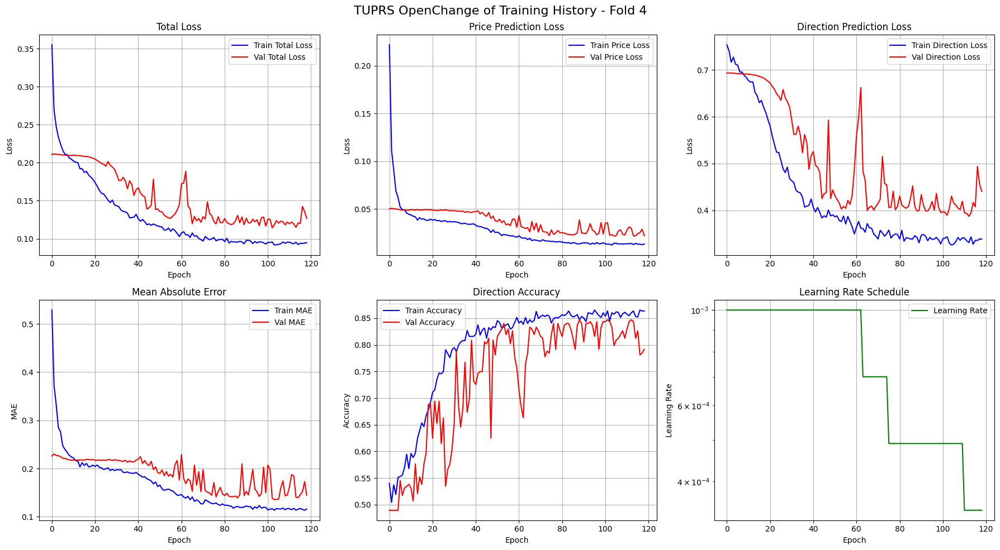

2025-05-30 01:20:01,209 [INFO] Training Enhanced Fold 5/7


Epoch 1/128
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - direction_output_binary_accuracy: 0.4931 - direction_output_loss: 0.7534 - direction_output_precision: 0.5062 - direction_output_recall: 0.4323 - loss: 0.3767 - price_output_loss: 0.2511 - price_output_mae_price: 0.5643 - price_output_mean_squared_error: 0.5680 - price_output_mean_squared_logarithmic_error: 0.0663
Epoch 1: val_loss improved from inf to 0.23315, saving model to temp_model_fold5.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - direction_output_binary_accuracy: 0.4937 - direction_output_loss: 0.7525 - direction_output_precision: 0.5072 - direction_output_recall: 0.4334 - loss: 0.3728 - price_output_loss: 0.2462 - price_output_mae_price: 0.5577 - price_output_mean_squared_error: 0.5558 - price_output_mean_squared_logarithmic_error: 0.0656 - val_direction_output_binary_accuracy: 0.5833 - val_direction_output_loss: 0.6878 - val_direction_output_precision: 0.5833 - val_direction_output_recall: 1.0000 - val_loss: 0.2331 - v

2025-05-30 01:21:19,475 [INFO] Fold 5 optimal threshold: 0.416
2025-05-30 01:21:19,481 [INFO] Fold 5 Enhanced Metrics:
2025-05-30 01:21:19,482 [INFO] Best validation loss: 0.1531 at epoch 46
2025-05-30 01:21:19,484 [INFO] Standard accuracy (0.5 threshold): 0.8125
2025-05-30 01:21:19,486 [INFO] Optimized accuracy (0.416 threshold): 0.8438
2025-05-30 01:21:19,487 [INFO] Optimized F1 score: 0.8673
2025-05-30 01:21:19,488 [INFO] Brier score: 0.1314
2025-05-30 01:21:19,488 [INFO] Calibration error: 0.0639


Plot kaydedildi: Results/OpenChange/Plotting/TUPRS/TUPRS OpenChange of training_history_fold5.png


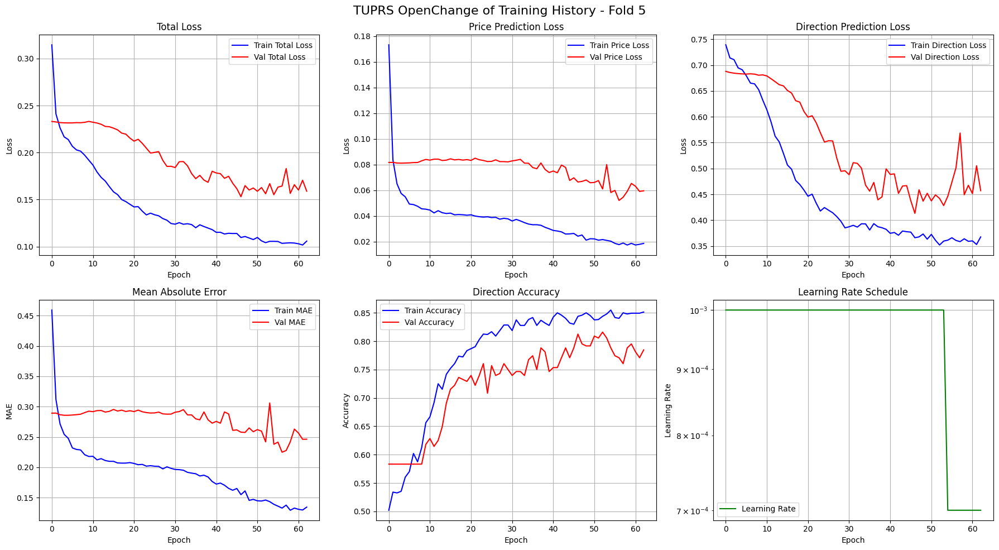

2025-05-30 01:21:22,701 [INFO] Training Enhanced Fold 6/7


Epoch 1/128
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - direction_output_binary_accuracy: 0.5119 - direction_output_loss: 0.7401 - direction_output_precision: 0.5262 - direction_output_recall: 0.5277 - loss: 0.3939 - price_output_loss: 0.2785 - price_output_mae_price: 0.5962 - price_output_mean_squared_error: 0.6774 - price_output_mean_squared_logarithmic_error: 0.0625
Epoch 1: val_loss improved from inf to 0.24587, saving model to temp_model_fold6.keras
18/18 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - direction_output_binary_accuracy: 0.5133 - direction_output_loss: 0.7382 - direction_output_precision: 0.5288 - direction_output_recall: 0.5297 - loss: 0.3860 - price_output_loss: 0.2686 - price_output_mae_price: 0.5830 - price_output_mean_squared_error: 0.6502 - price_output_mean_squared_logarithmic_error: 0.0621 - val_direction_output_binary_accuracy: 0.4861 - val_direction_output_loss: 0.6930 - val_direction_output_precision: 0.5166 - val_direction_output_recall: 0.5098 - val_loss: 0.2459 - v

2025-05-30 01:23:26,620 [INFO] Fold 6 optimal threshold: 0.443
2025-05-30 01:23:26,630 [INFO] Fold 6 Enhanced Metrics:
2025-05-30 01:23:26,631 [INFO] Best validation loss: 0.1219 at epoch 79
2025-05-30 01:23:26,631 [INFO] Standard accuracy (0.5 threshold): 0.8646
2025-05-30 01:23:26,632 [INFO] Optimized accuracy (0.443 threshold): 0.8646
2025-05-30 01:23:26,633 [INFO] Optimized F1 score: 0.8793
2025-05-30 01:23:26,634 [INFO] Brier score: 0.1031
2025-05-30 01:23:26,635 [INFO] Calibration error: 0.0449


Plot kaydedildi: Results/OpenChange/Plotting/TUPRS/TUPRS OpenChange of training_history_fold6.png


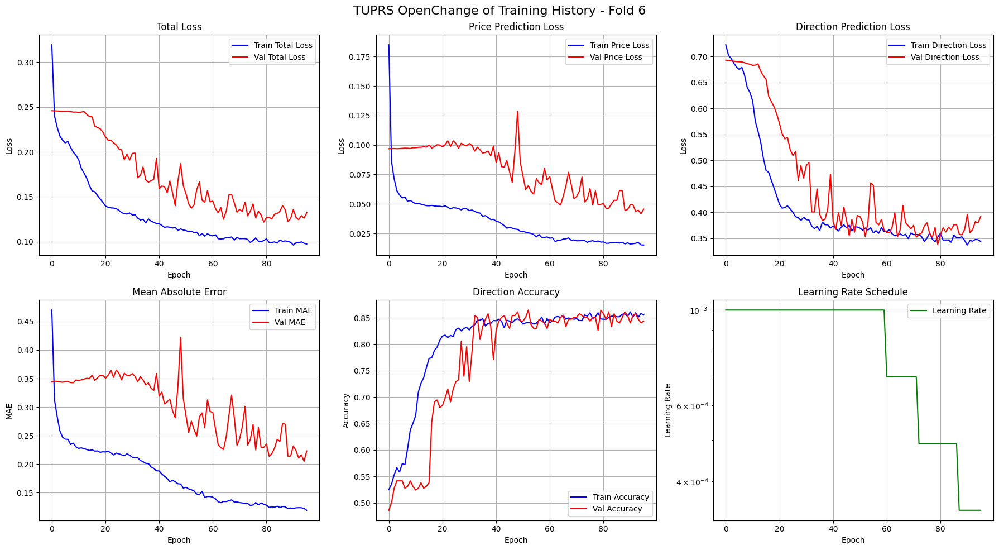

2025-05-30 01:23:29,963 [INFO] Training Enhanced Fold 7/7


Epoch 1/128
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - direction_output_binary_accuracy: 0.5281 - direction_output_loss: 0.7243 - direction_output_precision: 0.5803 - direction_output_recall: 0.3012 - loss: 0.3739 - price_output_loss: 0.2572 - price_output_mae_price: 0.5654 - price_output_mean_squared_error: 0.6052 - price_output_mean_squared_logarithmic_error: 0.1607
Epoch 1: val_loss improved from inf to 0.20134, saving model to temp_model_fold7.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 12s 145ms/step - direction_output_binary_accuracy: 0.5278 - direction_output_loss: 0.7241 - direction_output_precision: 0.5805 - direction_output_recall: 0.3020 - loss: 0.3711 - price_output_loss: 0.2534 - price_output_mae_price: 0.5603 - price_output_mean_squared_error: 0.5953 - price_output_mean_squared_logarithmic_error: 0.1578 - val_direction_output_binary_accuracy: 0.5035 - val_direction_output_loss: 0.6926 - val_direction_output_precision: 0.4897 - val_direction_output_recall: 0.8623 - val_loss: 0.2013 - 

2025-05-30 01:25:11,558 [INFO] Fold 7 optimal threshold: 0.545
2025-05-30 01:25:11,564 [INFO] Fold 7 Enhanced Metrics:
2025-05-30 01:25:11,565 [INFO] Best validation loss: 0.1004 at epoch 48
2025-05-30 01:25:11,565 [INFO] Standard accuracy (0.5 threshold): 0.8368
2025-05-30 01:25:11,566 [INFO] Optimized accuracy (0.545 threshold): 0.8472
2025-05-30 01:25:11,567 [INFO] Optimized F1 score: 0.8333
2025-05-30 01:25:11,568 [INFO] Brier score: 0.1134
2025-05-30 01:25:11,568 [INFO] Calibration error: 0.0392


Plot kaydedildi: Results/OpenChange/Plotting/TUPRS/TUPRS OpenChange of training_history_fold7.png


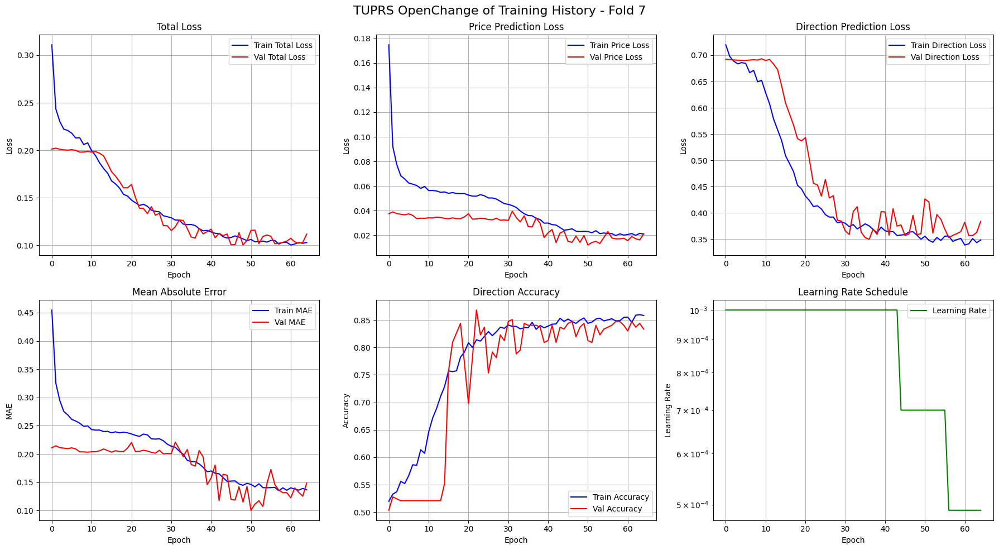

2025-05-30 01:25:15,059 [INFO] ENHANCED MODEL EVALUATION WITH THRESHOLD OPTIMIZATION & CALIBRATION
2025-05-30 01:25:15,061 [INFO] Global optimal threshold: 0.408
2025-05-30 01:25:15,063 [INFO] Fold 1 Enhanced Results:
2025-05-30 01:25:15,064 [INFO] Validation Loss: 0.1768
2025-05-30 01:25:15,064 [INFO] Price MAE: 0.1573
2025-05-30 01:25:15,067 [INFO] Standard Accuracy (0.5): 0.5903
2025-05-30 01:25:15,068 [INFO] Optimized Accuracy (0.594): 0.7326
2025-05-30 01:25:15,069 [INFO] Optimized F1: 0.7794
2025-05-30 01:25:15,069 [INFO] Brier Score: 0.2236
2025-05-30 01:25:15,070 [INFO] Calibration Error: 0.1713
2025-05-30 01:25:15,071 [INFO] Fold 2 Enhanced Results:
2025-05-30 01:25:15,071 [INFO] Validation Loss: 0.1504
2025-05-30 01:25:15,072 [INFO] Price MAE: 0.2372
2025-05-30 01:25:15,073 [INFO] Standard Accuracy (0.5): 0.8333
2025-05-30 01:25:15,073 [INFO] Optimized Accuracy (0.519): 0.8368
2025-05-30 01:25:15,074 [INFO] Optimized F1: 0.8459
2025-05-30 01:25:15,076 [INFO] Brier Score: 0.12

Epoch 1/128
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - direction_output_binary_accuracy: 0.5185 - direction_output_loss: 0.7826 - direction_output_precision: 0.5192 - direction_output_recall: 0.7222 - loss: 0.5061 - price_output_loss: 0.4139 - price_output_mae_price: 0.7797 - price_output_mean_squared_error: 1.0580 - price_output_mean_squared_logarithmic_error: 0.1602
Epoch 1: val_loss improved from inf to 0.19249, saving model to temp_model_fold1.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 620ms/step - direction_output_binary_accuracy: 0.5174 - direction_output_loss: 0.7810 - direction_output_precision: 0.5150 - direction_output_recall: 0.7243 - loss: 0.4974 - price_output_loss: 0.4029 - price_output_mae_price: 0.7666 - price_output_mean_squared_error: 1.0192 - price_output_mean_squared_logarithmic_error: 0.1526 - val_direction_output_binary_accuracy: 0.4826 - val_direction_output_loss: 0.6942 - val_direction_output_precision: 0.0000e+00 - val_direction_output_recall: 0.0000e+00 - val_loss: 0.1925

2025-05-30 01:26:11,280 [INFO] Fold 1 optimal threshold: 0.289
2025-05-30 01:26:11,285 [INFO] Fold 1 Enhanced Metrics:
2025-05-30 01:26:11,286 [INFO] Best validation loss: 0.1921 at epoch 52
2025-05-30 01:26:11,287 [INFO] Standard accuracy (0.5 threshold): 0.4826
2025-05-30 01:26:11,287 [INFO] Optimized accuracy (0.289 threshold): 0.5174
2025-05-30 01:26:11,288 [INFO] Optimized F1 score: 0.6819
2025-05-30 01:26:11,290 [INFO] Brier score: 0.2484
2025-05-30 01:26:11,291 [INFO] Calibration error: 0.0383


Plot kaydedildi: Results/OpenChange/Plotting/VAKBN/VAKBN OpenChange of training_history_fold1.png


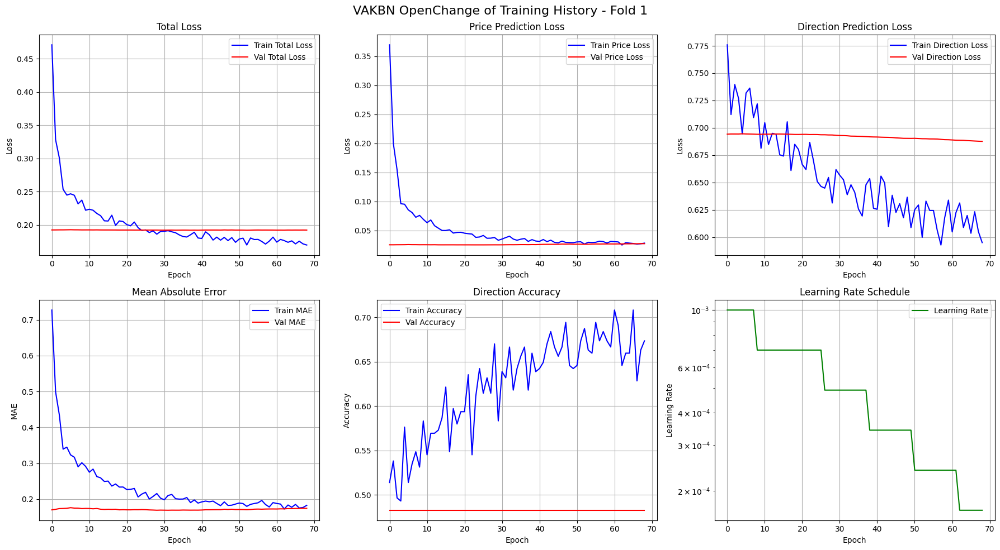

2025-05-30 01:26:14,091 [INFO] Training Enhanced Fold 2/7


Epoch 1/128
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - direction_output_binary_accuracy: 0.4757 - direction_output_loss: 0.8215 - direction_output_precision: 0.4331 - direction_output_recall: 0.4215 - loss: 0.5557 - price_output_loss: 0.4671 - price_output_mae_price: 0.8109 - price_output_mean_squared_error: 1.3312 - price_output_mean_squared_logarithmic_error: 0.3115
Epoch 1: val_loss improved from inf to 0.21499, saving model to temp_model_fold2.keras
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 268ms/step - direction_output_binary_accuracy: 0.4747 - direction_output_loss: 0.8155 - direction_output_precision: 0.4444 - direction_output_recall: 0.4203 - loss: 0.5203 - price_output_loss: 0.4219 - price_output_mae_price: 0.7582 - price_output_mean_squared_error: 1.1785 - price_output_mean_squared_logarithmic_error: 0.2822 - val_direction_output_binary_accuracy: 0.4722 - val_direction_output_loss: 0.6943 - val_direction_output_precision: 0.4286 - val_direction_output_recall: 0.0604 - val_loss: 0.2150 - val_p

2025-05-30 01:27:44,592 [INFO] Fold 2 optimal threshold: 0.287
2025-05-30 01:27:44,597 [INFO] Fold 2 Enhanced Metrics:
2025-05-30 01:27:44,602 [INFO] Best validation loss: 0.1526 at epoch 106
2025-05-30 01:27:44,603 [INFO] Standard accuracy (0.5 threshold): 0.7812
2025-05-30 01:27:44,604 [INFO] Optimized accuracy (0.287 threshold): 0.7639
2025-05-30 01:27:44,605 [INFO] Optimized F1 score: 0.8023
2025-05-30 01:27:44,605 [INFO] Brier score: 0.1422
2025-05-30 01:27:44,606 [INFO] Calibration error: 0.0537


Plot kaydedildi: Results/OpenChange/Plotting/VAKBN/VAKBN OpenChange of training_history_fold2.png


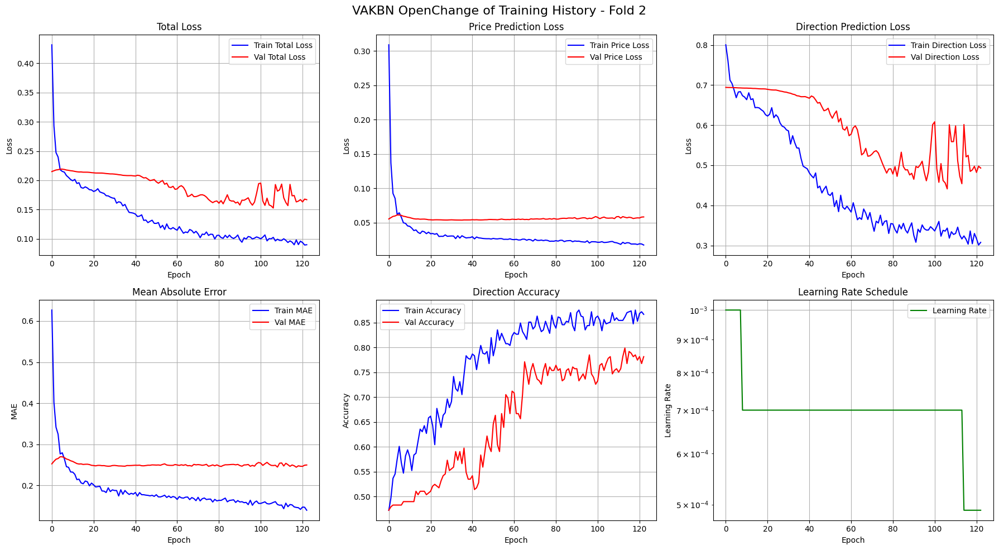

2025-05-30 01:27:48,067 [INFO] Training Enhanced Fold 3/7


Epoch 1/128
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - direction_output_binary_accuracy: 0.5174 - direction_output_loss: 0.7211 - direction_output_precision: 0.5049 - direction_output_recall: 0.7031 - loss: 0.4728 - price_output_loss: 0.3901 - price_output_mae_price: 0.7399 - price_output_mean_squared_error: 1.0127 - price_output_mean_squared_logarithmic_error: 0.0917
Epoch 1: val_loss improved from inf to 0.21130, saving model to temp_model_fold3.keras
9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 183ms/step - direction_output_binary_accuracy: 0.5192 - direction_output_loss: 0.7192 - direction_output_precision: 0.5077 - direction_output_recall: 0.7014 - loss: 0.4640 - price_output_loss: 0.3790 - price_output_mae_price: 0.7260 - price_output_mean_squared_error: 0.9785 - price_output_mean_squared_logarithmic_error: 0.0899 - val_direction_output_binary_accuracy: 0.5417 - val_direction_output_loss: 0.6928 - val_direction_output_precision: 0.6264 - val_direction_output_recall: 0.3677 - val_loss: 0.2113 - val_p

2025-05-30 01:28:32,845 [INFO] Fold 3 optimal threshold: 0.289
2025-05-30 01:28:32,850 [INFO] Fold 3 Enhanced Metrics:
2025-05-30 01:28:32,851 [INFO] Best validation loss: 0.2087 at epoch 28
2025-05-30 01:28:32,852 [INFO] Standard accuracy (0.5 threshold): 0.5382
2025-05-30 01:28:32,853 [INFO] Optimized accuracy (0.289 threshold): 0.5382
2025-05-30 01:28:32,854 [INFO] Optimized F1 score: 0.6998
2025-05-30 01:28:32,855 [INFO] Brier score: 0.2444
2025-05-30 01:28:32,856 [INFO] Calibration error: 0.0650


Plot kaydedildi: Results/OpenChange/Plotting/VAKBN/VAKBN OpenChange of training_history_fold3.png


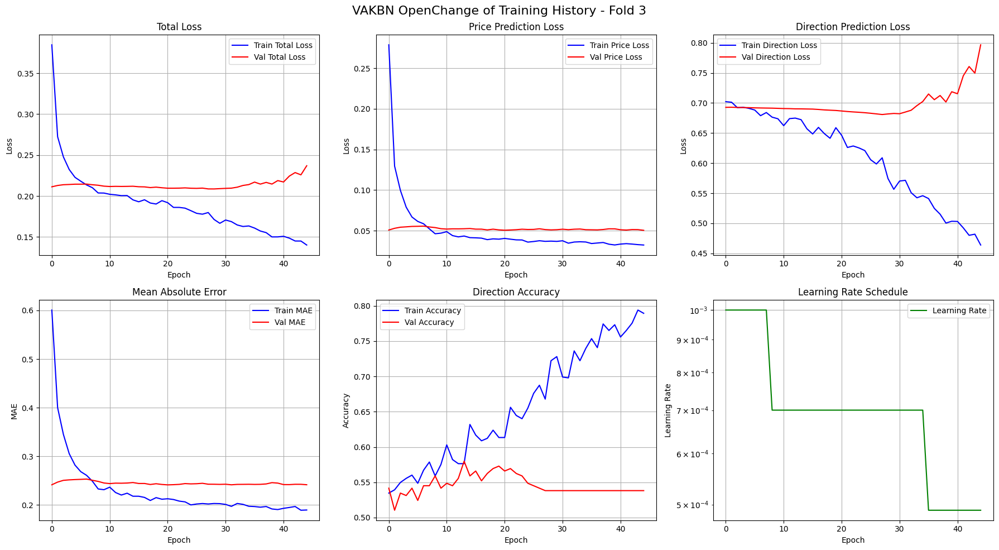

2025-05-30 01:28:35,945 [INFO] Training Enhanced Fold 4/7


Epoch 1/128
11/12 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - direction_output_binary_accuracy: 0.4805 - direction_output_loss: 0.7629 - direction_output_precision: 0.4861 - direction_output_recall: 0.4756 - loss: 0.3828 - price_output_loss: 0.2561 - price_output_mae_price: 0.5779 - price_output_mean_squared_error: 0.5970 - price_output_mean_squared_logarithmic_error: 0.0905
Epoch 1: val_loss improved from inf to 0.20102, saving model to temp_model_fold4.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - direction_output_binary_accuracy: 0.4825 - direction_output_loss: 0.7595 - direction_output_precision: 0.4897 - direction_output_recall: 0.4780 - loss: 0.3757 - price_output_loss: 0.2478 - price_output_mae_price: 0.5665 - price_output_mean_squared_error: 0.5743 - price_output_mean_squared_logarithmic_error: 0.0889 - val_direction_output_binary_accuracy: 0.4514 - val_direction_output_loss: 0.6943 - val_direction_output_precision: 0.4082 - val_direction_output_recall: 0.1342 - val_loss: 0.2010 - v

2025-05-30 01:30:35,408 [INFO] Fold 4 optimal threshold: 0.405
2025-05-30 01:30:35,414 [INFO] Fold 4 Enhanced Metrics:
2025-05-30 01:30:35,417 [INFO] Best validation loss: 0.1049 at epoch 97
2025-05-30 01:30:35,418 [INFO] Standard accuracy (0.5 threshold): 0.8264
2025-05-30 01:30:35,420 [INFO] Optimized accuracy (0.405 threshold): 0.8368
2025-05-30 01:30:35,421 [INFO] Optimized F1 score: 0.8517
2025-05-30 01:30:35,423 [INFO] Brier score: 0.1198
2025-05-30 01:30:35,423 [INFO] Calibration error: 0.0473


Plot kaydedildi: Results/OpenChange/Plotting/VAKBN/VAKBN OpenChange of training_history_fold4.png


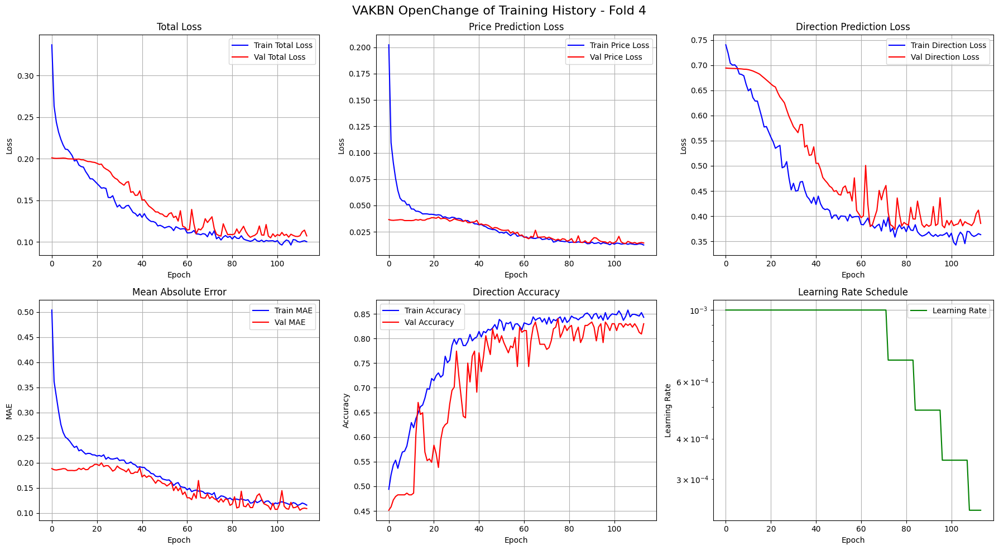

2025-05-30 01:30:41,168 [INFO] Training Enhanced Fold 5/7


Epoch 1/128
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - direction_output_binary_accuracy: 0.5049 - direction_output_loss: 0.7413 - direction_output_precision: 0.5126 - direction_output_recall: 0.4378 - loss: 0.3264 - price_output_loss: 0.1881 - price_output_mae_price: 0.4864 - price_output_mean_squared_error: 0.4064 - price_output_mean_squared_logarithmic_error: 0.1030
Epoch 1: val_loss improved from inf to 0.23344, saving model to temp_model_fold5.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - direction_output_binary_accuracy: 0.5046 - direction_output_loss: 0.7409 - direction_output_precision: 0.5130 - direction_output_recall: 0.4369 - loss: 0.3241 - price_output_loss: 0.1852 - price_output_mae_price: 0.4821 - price_output_mean_squared_error: 0.3998 - price_output_mean_squared_logarithmic_error: 0.1011 - val_direction_output_binary_accuracy: 0.4410 - val_direction_output_loss: 0.6939 - val_direction_output_precision: 0.0000e+00 - val_direction_output_recall: 0.0000e+00 - val_loss: 0

2025-05-30 01:32:27,565 [INFO] Fold 5 optimal threshold: 0.462
2025-05-30 01:32:27,570 [INFO] Fold 5 Enhanced Metrics:
2025-05-30 01:32:27,571 [INFO] Best validation loss: 0.1751 at epoch 67
2025-05-30 01:32:27,572 [INFO] Standard accuracy (0.5 threshold): 0.8090
2025-05-30 01:32:27,573 [INFO] Optimized accuracy (0.462 threshold): 0.8160
2025-05-30 01:32:27,574 [INFO] Optimized F1 score: 0.8408
2025-05-30 01:32:27,575 [INFO] Brier score: 0.1415
2025-05-30 01:32:27,576 [INFO] Calibration error: 0.0743


Plot kaydedildi: Results/OpenChange/Plotting/VAKBN/VAKBN OpenChange of training_history_fold5.png


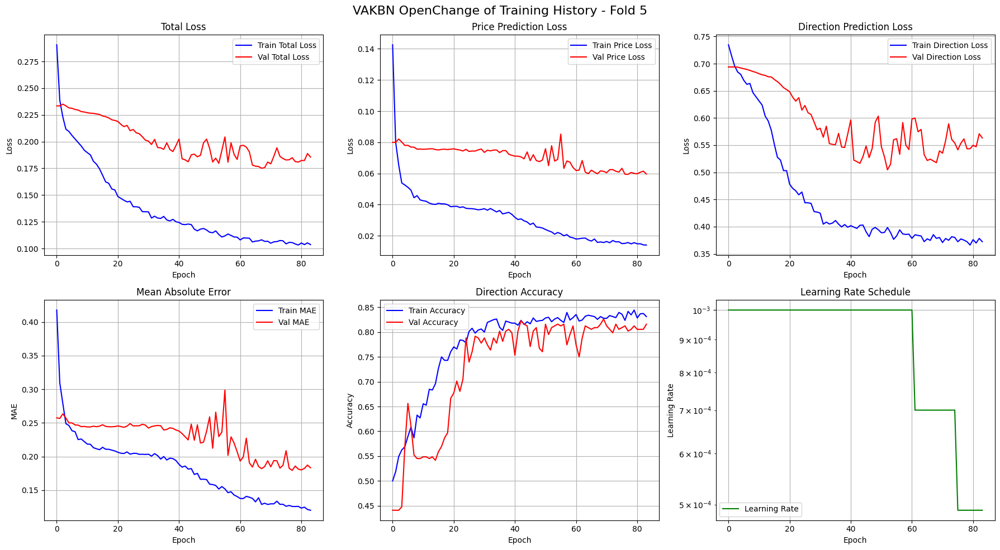

2025-05-30 01:32:30,765 [INFO] Training Enhanced Fold 6/7


Epoch 1/128
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - direction_output_binary_accuracy: 0.4914 - direction_output_loss: 0.7574 - direction_output_precision: 0.5058 - direction_output_recall: 0.5711 - loss: 0.3639 - price_output_loss: 0.2327 - price_output_mae_price: 0.5460 - price_output_mean_squared_error: 0.5283 - price_output_mean_squared_logarithmic_error: 0.0711
Epoch 1: val_loss improved from inf to 0.25140, saving model to temp_model_fold6.keras
18/18 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - direction_output_binary_accuracy: 0.4930 - direction_output_loss: 0.7561 - direction_output_precision: 0.5076 - direction_output_recall: 0.5719 - loss: 0.3610 - price_output_loss: 0.2294 - price_output_mae_price: 0.5413 - price_output_mean_squared_error: 0.5201 - price_output_mean_squared_logarithmic_error: 0.0707 - val_direction_output_binary_accuracy: 0.5208 - val_direction_output_loss: 0.6919 - val_direction_output_precision: 0.0000e+00 - val_direction_output_recall: 0.0000e+00 - val_loss: 0

2025-05-30 01:34:27,483 [INFO] Fold 6 optimal threshold: 0.406
2025-05-30 01:34:27,488 [INFO] Fold 6 Enhanced Metrics:
2025-05-30 01:34:27,489 [INFO] Best validation loss: 0.1519 at epoch 67
2025-05-30 01:34:27,490 [INFO] Standard accuracy (0.5 threshold): 0.8125
2025-05-30 01:34:27,491 [INFO] Optimized accuracy (0.406 threshold): 0.8299
2025-05-30 01:34:27,492 [INFO] Optimized F1 score: 0.8281
2025-05-30 01:34:27,493 [INFO] Brier score: 0.1365
2025-05-30 01:34:27,494 [INFO] Calibration error: 0.0517


Plot kaydedildi: Results/OpenChange/Plotting/VAKBN/VAKBN OpenChange of training_history_fold6.png


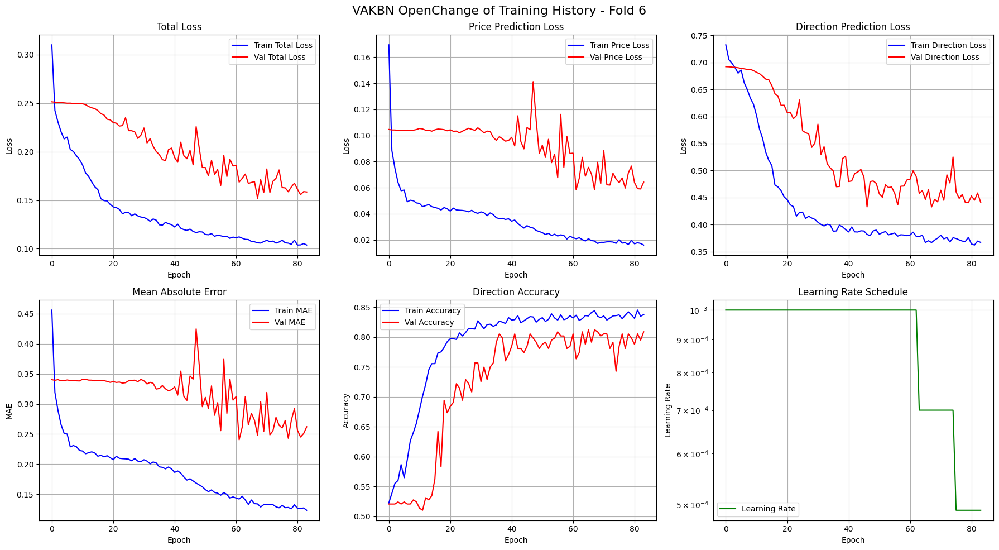

2025-05-30 01:34:30,682 [INFO] Training Enhanced Fold 7/7


Epoch 1/128
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - direction_output_binary_accuracy: 0.5091 - direction_output_loss: 0.8167 - direction_output_precision: 0.5542 - direction_output_recall: 0.3988 - loss: 0.4483 - price_output_loss: 0.3256 - price_output_mae_price: 0.6555 - price_output_mean_squared_error: 0.8066 - price_output_mean_squared_logarithmic_error: 0.1739
Epoch 1: val_loss improved from inf to 0.22073, saving model to temp_model_fold7.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - direction_output_binary_accuracy: 0.5101 - direction_output_loss: 0.8143 - direction_output_precision: 0.5544 - direction_output_recall: 0.4013 - loss: 0.4441 - price_output_loss: 0.3207 - price_output_mae_price: 0.6493 - price_output_mean_squared_error: 0.7930 - price_output_mean_squared_logarithmic_error: 0.1709 - val_direction_output_binary_accuracy: 0.5590 - val_direction_output_loss: 0.6895 - val_direction_output_precision: 0.5590 - val_direction_output_recall: 1.0000 - val_loss: 0.2207 - 

2025-05-30 01:37:03,772 [INFO] Fold 7 optimal threshold: 0.287
2025-05-30 01:37:03,777 [INFO] Fold 7 Enhanced Metrics:
2025-05-30 01:37:03,778 [INFO] Best validation loss: 0.0981 at epoch 92
2025-05-30 01:37:03,779 [INFO] Standard accuracy (0.5 threshold): 0.8299
2025-05-30 01:37:03,780 [INFO] Optimized accuracy (0.287 threshold): 0.8576
2025-05-30 01:37:03,781 [INFO] Optimized F1 score: 0.8791
2025-05-30 01:37:03,782 [INFO] Brier score: 0.1085
2025-05-30 01:37:03,783 [INFO] Calibration error: 0.0721


Plot kaydedildi: Results/OpenChange/Plotting/VAKBN/VAKBN OpenChange of training_history_fold7.png


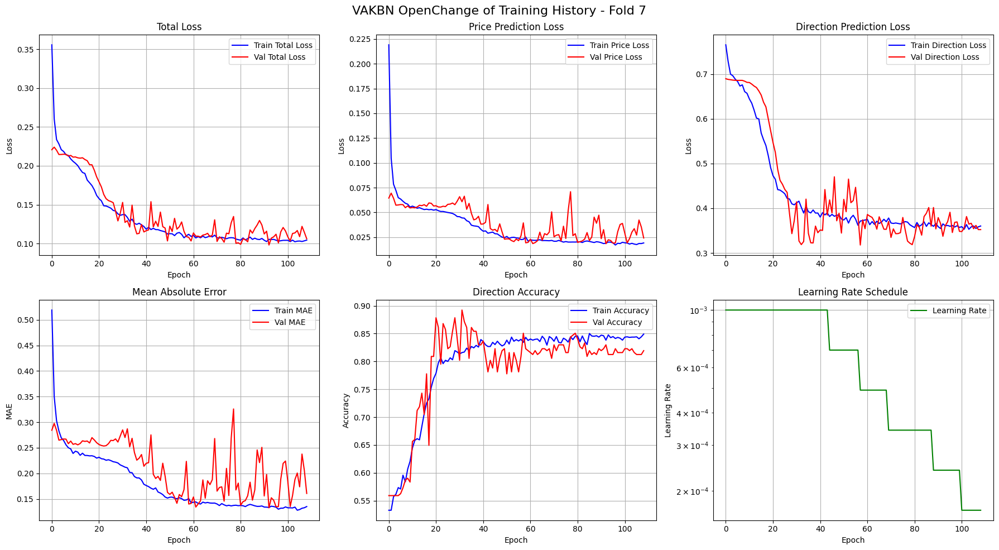

2025-05-30 01:37:07,445 [INFO] ENHANCED MODEL EVALUATION WITH THRESHOLD OPTIMIZATION & CALIBRATION
2025-05-30 01:37:07,449 [INFO] Global optimal threshold: 0.350
2025-05-30 01:37:07,450 [INFO] Fold 1 Enhanced Results:
2025-05-30 01:37:07,451 [INFO] Validation Loss: 0.1921
2025-05-30 01:37:07,453 [INFO] Price MAE: 0.1706
2025-05-30 01:37:07,454 [INFO] Standard Accuracy (0.5): 0.4826
2025-05-30 01:37:07,454 [INFO] Optimized Accuracy (0.289): 0.5174
2025-05-30 01:37:07,455 [INFO] Optimized F1: 0.6819
2025-05-30 01:37:07,456 [INFO] Brier Score: 0.2484
2025-05-30 01:37:07,458 [INFO] Calibration Error: 0.0383
2025-05-30 01:37:07,459 [INFO] Fold 2 Enhanced Results:
2025-05-30 01:37:07,460 [INFO] Validation Loss: 0.1526
2025-05-30 01:37:07,460 [INFO] Price MAE: 0.2486
2025-05-30 01:37:07,463 [INFO] Standard Accuracy (0.5): 0.7812
2025-05-30 01:37:07,464 [INFO] Optimized Accuracy (0.287): 0.7639
2025-05-30 01:37:07,464 [INFO] Optimized F1: 0.8023
2025-05-30 01:37:07,465 [INFO] Brier Score: 0.14

Epoch 1/128
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - direction_output_binary_accuracy: 0.4618 - direction_output_loss: 0.7941 - direction_output_precision: 0.4657 - direction_output_recall: 0.6197 - loss: 0.4755 - price_output_loss: 0.3693 - price_output_mae_price: 0.7256 - price_output_mean_squared_error: 0.8960 - price_output_mean_squared_logarithmic_error: 0.1502
Epoch 1: val_loss improved from inf to 0.19033, saving model to temp_model_fold1.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 891ms/step - direction_output_binary_accuracy: 0.4635 - direction_output_loss: 0.7895 - direction_output_precision: 0.4645 - direction_output_recall: 0.6242 - loss: 0.4680 - price_output_loss: 0.3608 - price_output_mae_price: 0.7155 - price_output_mean_squared_error: 0.8683 - price_output_mean_squared_logarithmic_error: 0.1469 - val_direction_output_binary_accuracy: 0.4514 - val_direction_output_loss: 0.6938 - val_direction_output_precision: 0.0000e+00 - val_direction_output_recall: 0.0000e+00 - val_loss: 0.190

2025-05-30 01:37:35,993 [INFO] Fold 1 optimal threshold: 0.289
2025-05-30 01:37:35,999 [INFO] Fold 1 Enhanced Metrics:
2025-05-30 01:37:36,000 [INFO] Best validation loss: 0.1903 at epoch 0
2025-05-30 01:37:36,001 [INFO] Standard accuracy (0.5 threshold): 0.4514
2025-05-30 01:37:36,001 [INFO] Optimized accuracy (0.289 threshold): 0.5486
2025-05-30 01:37:36,004 [INFO] Optimized F1 score: 0.7085
2025-05-30 01:37:36,004 [INFO] Brier score: 0.2503
2025-05-30 01:37:36,005 [INFO] Calibration error: 0.0544


Plot kaydedildi: Results/OpenChange/Plotting/YKBNK/YKBNK OpenChange of training_history_fold1.png


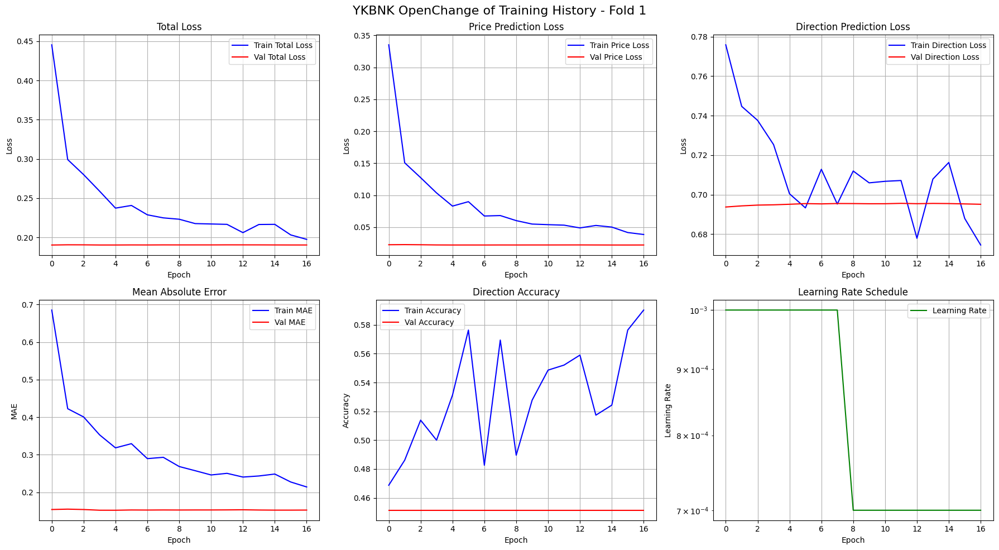

2025-05-30 01:37:39,647 [INFO] Training Enhanced Fold 2/7


Epoch 1/128
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - direction_output_binary_accuracy: 0.4958 - direction_output_loss: 0.7828 - direction_output_precision: 0.4780 - direction_output_recall: 0.5573 - loss: 0.3640 - price_output_loss: 0.2243 - price_output_mae_price: 0.5321 - price_output_mean_squared_error: 0.4951 - price_output_mean_squared_logarithmic_error: 0.0975
Epoch 1: val_loss improved from inf to 0.20842, saving model to temp_model_fold2.keras
6/6 ━━━━━━━━━━━━━━━━━━━━ 10s 349ms/step - direction_output_binary_accuracy: 0.4975 - direction_output_loss: 0.7784 - direction_output_precision: 0.4884 - direction_output_recall: 0.5535 - loss: 0.3549 - price_output_loss: 0.2138 - price_output_mae_price: 0.5183 - price_output_mean_squared_error: 0.4693 - price_output_mean_squared_logarithmic_error: 0.0928 - val_direction_output_binary_accuracy: 0.4965 - val_direction_output_loss: 0.6935 - val_direction_output_precision: 0.0000e+00 - val_direction_output_recall: 0.0000e+00 - val_loss: 0.208

2025-05-30 01:38:01,610 [INFO] Fold 2 optimal threshold: 0.289
2025-05-30 01:38:01,614 [INFO] Fold 2 Enhanced Metrics:
2025-05-30 01:38:01,615 [INFO] Best validation loss: 0.2084 at epoch 0
2025-05-30 01:38:01,616 [INFO] Standard accuracy (0.5 threshold): 0.4965
2025-05-30 01:38:01,616 [INFO] Optimized accuracy (0.289 threshold): 0.5035
2025-05-30 01:38:01,617 [INFO] Optimized F1 score: 0.6697
2025-05-30 01:38:01,617 [INFO] Brier score: 0.2502
2025-05-30 01:38:01,618 [INFO] Calibration error: 0.0160


Plot kaydedildi: Results/OpenChange/Plotting/YKBNK/YKBNK OpenChange of training_history_fold2.png


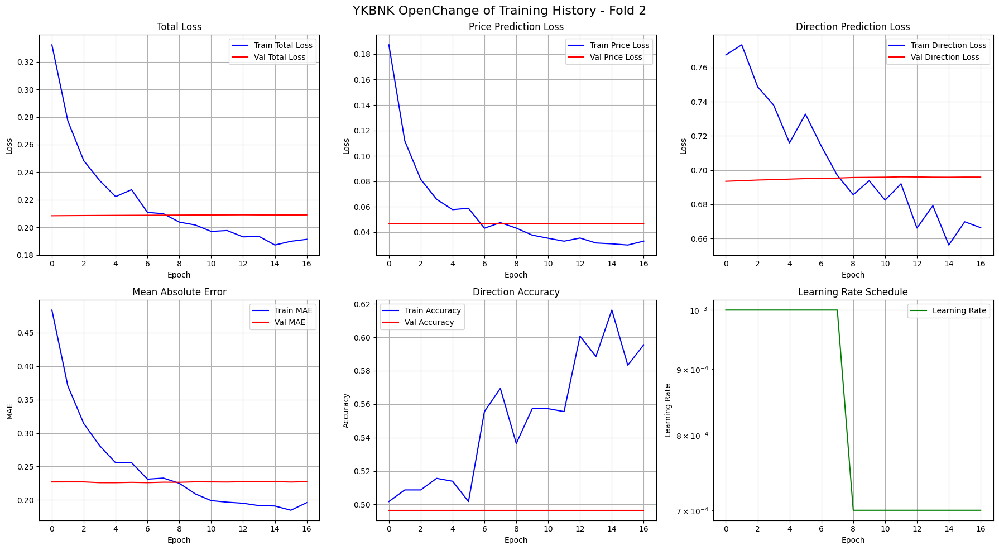

2025-05-30 01:38:05,265 [INFO] Training Enhanced Fold 3/7


Epoch 1/128
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - direction_output_binary_accuracy: 0.4624 - direction_output_loss: 0.7713 - direction_output_precision: 0.4649 - direction_output_recall: 0.5702 - loss: 0.3347 - price_output_loss: 0.1891 - price_output_mae_price: 0.4823 - price_output_mean_squared_error: 0.4044 - price_output_mean_squared_logarithmic_error: 0.0759
Epoch 1: val_loss improved from inf to 0.20910, saving model to temp_model_fold3.keras
9/9 ━━━━━━━━━━━━━━━━━━━━ 13s 238ms/step - direction_output_binary_accuracy: 0.4633 - direction_output_loss: 0.7711 - direction_output_precision: 0.4670 - direction_output_recall: 0.5705 - loss: 0.3318 - price_output_loss: 0.1854 - price_output_mae_price: 0.4768 - price_output_mean_squared_error: 0.3960 - price_output_mean_squared_logarithmic_error: 0.0747 - val_direction_output_binary_accuracy: 0.4653 - val_direction_output_loss: 0.6933 - val_direction_output_precision: 0.5000 - val_direction_output_recall: 0.4091 - val_loss: 0.2091 - val_

2025-05-30 01:40:05,595 [INFO] Fold 3 optimal threshold: 0.300
2025-05-30 01:40:05,601 [INFO] Fold 3 Enhanced Metrics:
2025-05-30 01:40:05,602 [INFO] Best validation loss: 0.1233 at epoch 114
2025-05-30 01:40:05,602 [INFO] Standard accuracy (0.5 threshold): 0.7986
2025-05-30 01:40:05,603 [INFO] Optimized accuracy (0.300 threshold): 0.8194
2025-05-30 01:40:05,603 [INFO] Optimized F1 score: 0.8434
2025-05-30 01:40:05,604 [INFO] Brier score: 0.1340
2025-05-30 01:40:05,605 [INFO] Calibration error: 0.0831


Plot kaydedildi: Results/OpenChange/Plotting/YKBNK/YKBNK OpenChange of training_history_fold3.png


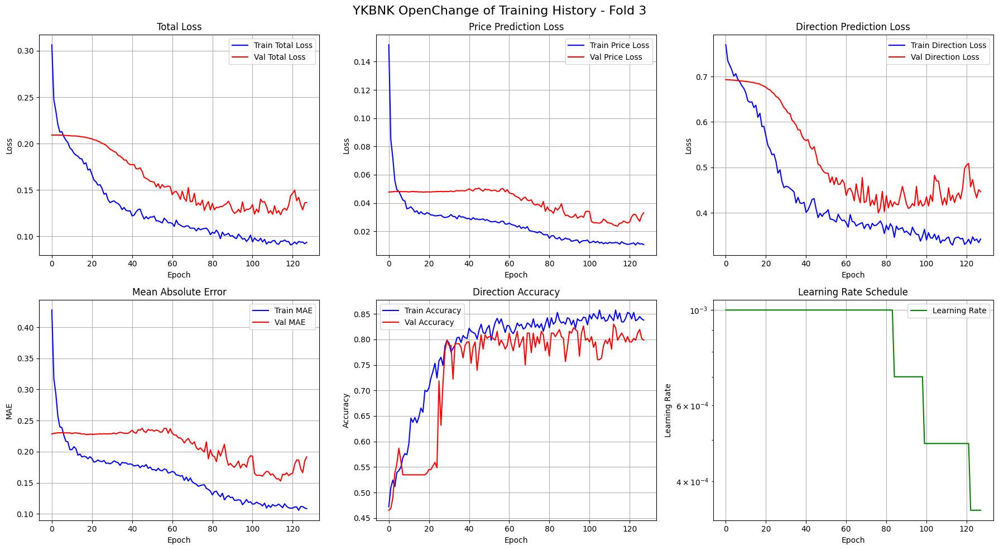

2025-05-30 01:40:09,163 [INFO] Training Enhanced Fold 4/7


Epoch 1/128
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - direction_output_binary_accuracy: 0.5434 - direction_output_loss: 0.7685 - direction_output_precision: 0.5710 - direction_output_recall: 0.5044 - loss: 0.4109 - price_output_loss: 0.2917 - price_output_mae_price: 0.6180 - price_output_mean_squared_error: 0.6809 - price_output_mean_squared_logarithmic_error: 0.1263
Epoch 1: val_loss improved from inf to 0.20519, saving model to temp_model_fold4.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 174ms/step - direction_output_binary_accuracy: 0.5412 - direction_output_loss: 0.7682 - direction_output_precision: 0.5681 - direction_output_recall: 0.5032 - loss: 0.4075 - price_output_loss: 0.2872 - price_output_mae_price: 0.6120 - price_output_mean_squared_error: 0.6695 - price_output_mean_squared_logarithmic_error: 0.1246 - val_direction_output_binary_accuracy: 0.4826 - val_direction_output_loss: 0.6939 - val_direction_output_precision: 0.4826 - val_direction_output_recall: 1.0000 - val_loss: 0.2052 - 

2025-05-30 01:41:33,044 [INFO] Fold 4 optimal threshold: 0.347
2025-05-30 01:41:33,051 [INFO] Fold 4 Enhanced Metrics:
2025-05-30 01:41:33,052 [INFO] Best validation loss: 0.1216 at epoch 57
2025-05-30 01:41:33,053 [INFO] Standard accuracy (0.5 threshold): 0.8299
2025-05-30 01:41:33,053 [INFO] Optimized accuracy (0.347 threshold): 0.7986
2025-05-30 01:41:33,055 [INFO] Optimized F1 score: 0.8141
2025-05-30 01:41:33,056 [INFO] Brier score: 0.1264
2025-05-30 01:41:33,056 [INFO] Calibration error: 0.0641


Plot kaydedildi: Results/OpenChange/Plotting/YKBNK/YKBNK OpenChange of training_history_fold4.png


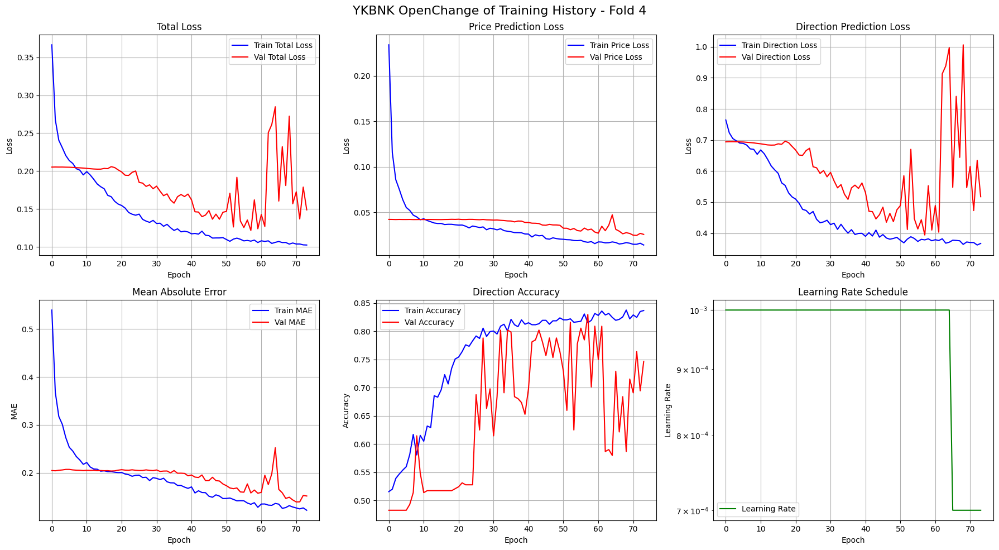

2025-05-30 01:41:36,332 [INFO] Training Enhanced Fold 5/7


Epoch 1/128
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - direction_output_binary_accuracy: 0.5483 - direction_output_loss: 0.7635 - direction_output_precision: 0.5577 - direction_output_recall: 0.6020 - loss: 0.4328 - price_output_loss: 0.3225 - price_output_mae_price: 0.6542 - price_output_mean_squared_error: 0.7852 - price_output_mean_squared_logarithmic_error: 0.1130
Epoch 1: val_loss improved from inf to 0.23869, saving model to temp_model_fold5.keras
15/15 ━━━━━━━━━━━━━━━━━━━━ 10s 142ms/step - direction_output_binary_accuracy: 0.5478 - direction_output_loss: 0.7628 - direction_output_precision: 0.5568 - direction_output_recall: 0.6036 - loss: 0.4283 - price_output_loss: 0.3169 - price_output_mae_price: 0.6467 - price_output_mean_squared_error: 0.7695 - price_output_mean_squared_logarithmic_error: 0.1115 - val_direction_output_binary_accuracy: 0.5764 - val_direction_output_loss: 0.6894 - val_direction_output_precision: 0.5769 - val_direction_output_recall: 0.9940 - val_loss: 0.2387 - 

2025-05-30 01:43:58,115 [INFO] Fold 5 optimal threshold: 0.285
2025-05-30 01:43:58,122 [INFO] Fold 5 Enhanced Metrics:
2025-05-30 01:43:58,122 [INFO] Best validation loss: 0.1589 at epoch 107
2025-05-30 01:43:58,124 [INFO] Standard accuracy (0.5 threshold): 0.8542
2025-05-30 01:43:58,125 [INFO] Optimized accuracy (0.285 threshold): 0.8403
2025-05-30 01:43:58,126 [INFO] Optimized F1 score: 0.8708
2025-05-30 01:43:58,128 [INFO] Brier score: 0.1144
2025-05-30 01:43:58,129 [INFO] Calibration error: 0.0516


Plot kaydedildi: Results/OpenChange/Plotting/YKBNK/YKBNK OpenChange of training_history_fold5.png


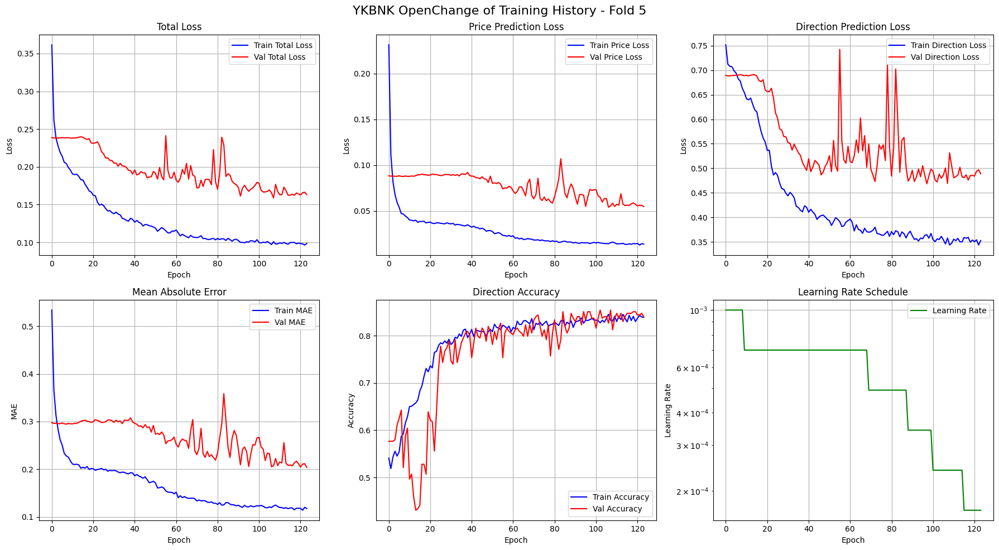

2025-05-30 01:44:01,139 [INFO] Training Enhanced Fold 6/7


Epoch 1/128
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - direction_output_binary_accuracy: 0.4862 - direction_output_loss: 0.7923 - direction_output_precision: 0.5126 - direction_output_recall: 0.3868 - loss: 0.3985 - price_output_loss: 0.2673 - price_output_mae_price: 0.5896 - price_output_mean_squared_error: 0.6030 - price_output_mean_squared_logarithmic_error: 0.1121
Epoch 1: val_loss improved from inf to 0.25271, saving model to temp_model_fold6.keras
18/18 ━━━━━━━━━━━━━━━━━━━━ 10s 136ms/step - direction_output_binary_accuracy: 0.4862 - direction_output_loss: 0.7908 - direction_output_precision: 0.5123 - direction_output_recall: 0.3864 - loss: 0.3953 - price_output_loss: 0.2634 - price_output_mae_price: 0.5843 - price_output_mean_squared_error: 0.5938 - price_output_mean_squared_logarithmic_error: 0.1107 - val_direction_output_binary_accuracy: 0.4826 - val_direction_output_loss: 0.6950 - val_direction_output_precision: 0.0000e+00 - val_direction_output_recall: 0.0000e+00 - val_loss: 0

2025-05-30 01:45:25,606 [INFO] Fold 6 optimal threshold: 0.289
2025-05-30 01:45:25,611 [INFO] Fold 6 Enhanced Metrics:
2025-05-30 01:45:25,612 [INFO] Best validation loss: 0.1619 at epoch 45
2025-05-30 01:45:25,614 [INFO] Standard accuracy (0.5 threshold): 0.8194
2025-05-30 01:45:25,615 [INFO] Optimized accuracy (0.289 threshold): 0.8333
2025-05-30 01:45:25,615 [INFO] Optimized F1 score: 0.8537
2025-05-30 01:45:25,616 [INFO] Brier score: 0.1226
2025-05-30 01:45:25,620 [INFO] Calibration error: 0.0555


Plot kaydedildi: Results/OpenChange/Plotting/YKBNK/YKBNK OpenChange of training_history_fold6.png


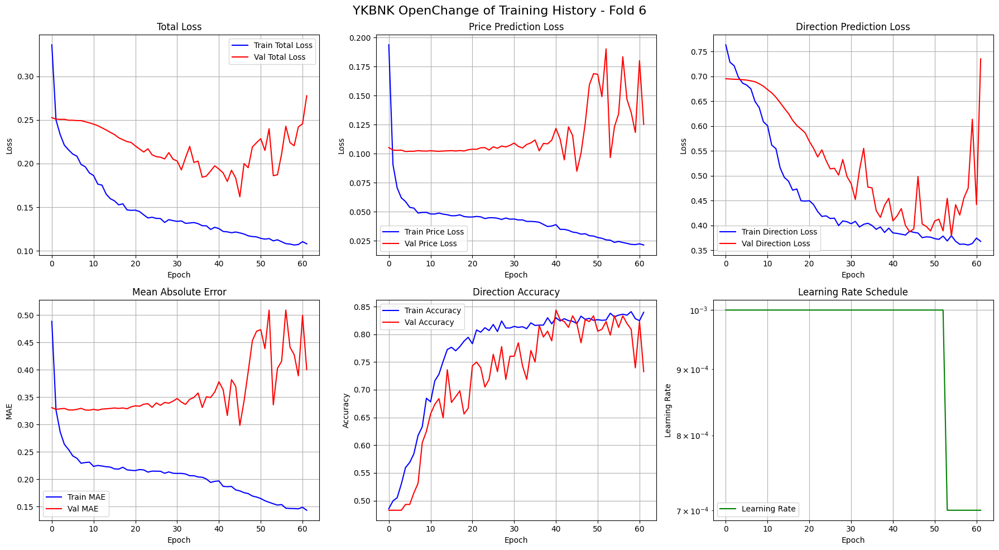

2025-05-30 01:45:28,911 [INFO] Training Enhanced Fold 7/7


Epoch 1/128
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - direction_output_binary_accuracy: 0.4998 - direction_output_loss: 0.8107 - direction_output_precision: 0.5194 - direction_output_recall: 0.6567 - loss: 0.3906 - price_output_loss: 0.2506 - price_output_mae_price: 0.5715 - price_output_mean_squared_error: 0.5915 - price_output_mean_squared_logarithmic_error: 0.0933
Epoch 1: val_loss improved from inf to 0.21848, saving model to temp_model_fold7.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - direction_output_binary_accuracy: 0.4995 - direction_output_loss: 0.8100 - direction_output_precision: 0.5189 - direction_output_recall: 0.6561 - loss: 0.3881 - price_output_loss: 0.2474 - price_output_mae_price: 0.5671 - price_output_mean_squared_error: 0.5828 - price_output_mean_squared_logarithmic_error: 0.0923 - val_direction_output_binary_accuracy: 0.4792 - val_direction_output_loss: 0.6967 - val_direction_output_precision: 0.0000e+00 - val_direction_output_recall: 0.0000e+00 - val_loss: 0

2025-05-30 01:47:48,581 [INFO] Fold 7 optimal threshold: 0.227
2025-05-30 01:47:48,585 [INFO] Fold 7 Enhanced Metrics:
2025-05-30 01:47:48,587 [INFO] Best validation loss: 0.1043 at epoch 84
2025-05-30 01:47:48,588 [INFO] Standard accuracy (0.5 threshold): 0.8542
2025-05-30 01:47:48,589 [INFO] Optimized accuracy (0.227 threshold): 0.8681
2025-05-30 01:47:48,589 [INFO] Optimized F1 score: 0.8812
2025-05-30 01:47:48,590 [INFO] Brier score: 0.1084
2025-05-30 01:47:48,590 [INFO] Calibration error: 0.0528


Plot kaydedildi: Results/OpenChange/Plotting/YKBNK/YKBNK OpenChange of training_history_fold7.png


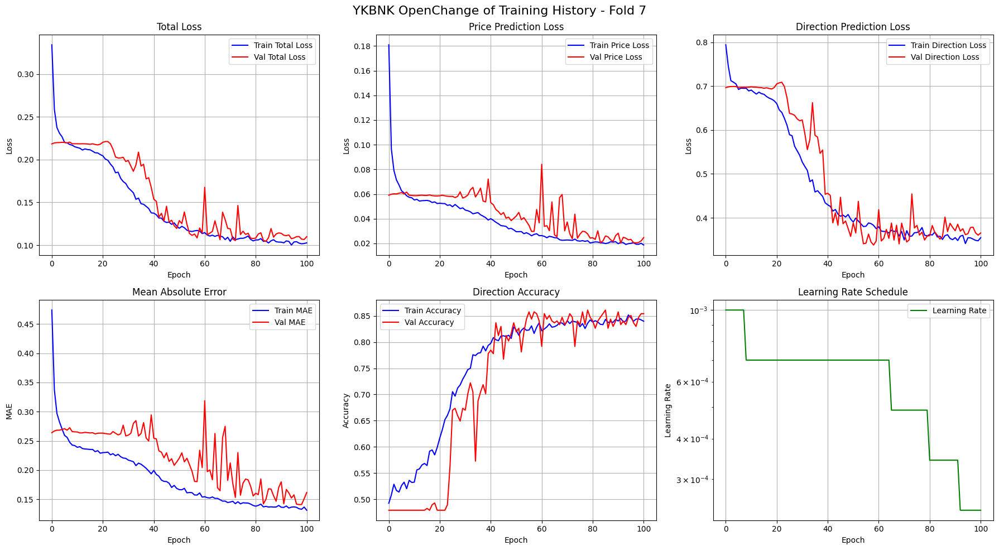

2025-05-30 01:47:52,193 [INFO] ENHANCED MODEL EVALUATION WITH THRESHOLD OPTIMIZATION & CALIBRATION
2025-05-30 01:47:52,194 [INFO] Global optimal threshold: 0.283
2025-05-30 01:47:52,195 [INFO] Fold 1 Enhanced Results:
2025-05-30 01:47:52,195 [INFO] Validation Loss: 0.1903
2025-05-30 01:47:52,196 [INFO] Price MAE: 0.1544
2025-05-30 01:47:52,197 [INFO] Standard Accuracy (0.5): 0.4514
2025-05-30 01:47:52,197 [INFO] Optimized Accuracy (0.289): 0.5486
2025-05-30 01:47:52,202 [INFO] Optimized F1: 0.7085
2025-05-30 01:47:52,203 [INFO] Brier Score: 0.2503
2025-05-30 01:47:52,204 [INFO] Calibration Error: 0.0544
2025-05-30 01:47:52,204 [INFO] Fold 2 Enhanced Results:
2025-05-30 01:47:52,205 [INFO] Validation Loss: 0.2084
2025-05-30 01:47:52,206 [INFO] Price MAE: 0.2269
2025-05-30 01:47:52,206 [INFO] Standard Accuracy (0.5): 0.4965
2025-05-30 01:47:52,207 [INFO] Optimized Accuracy (0.289): 0.5035
2025-05-30 01:47:52,208 [INFO] Optimized F1: 0.6697
2025-05-30 01:47:52,208 [INFO] Brier Score: 0.25

In [21]:
if __name__ == "__main__":
    run_all_companies()